In [209]:
# Gerekli kütüphaneleri import ediyoruz
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer,KNNImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# **Veri Seti Açıklaması**

Bu veri seti, büyük veri ve yapay zeka kullanarak sürdürülebilir görsel iletişim ve tasarımın kesişimini araştırıyor. Renk, düzenli kombinasyonlar ve öğe düzenlemeleri gibi özelliklerle sanatsal grafiklerin görsel iletişimiyle ilgili verileri içerir. Veri kümesi çevresel ölçümleri, malzeme verimliliğini, kullanıcı geri bildirimlerini, kültürel uygunluğu ve katılım oranlarını içermekte ve sürdürülebilir tasarımlar yaratmaya yönelik araştırmalar için kapsamlı bir temel sağlamaktadır. Hedef değişken olan sustainability_score, görsel tasarımın sürdürülebilirliğini değerlendirmeyi amaçlayan enerji tüketimi, çevresel etki ve malzeme verimliliği gibi çeşitli özelliklerin ağırlıklı bir toplamıdır.

Tasarım süreçlerini optimize etmeye, görsel iletişimde sürdürülebilirliği geliştirmeye ve tasarım sistemlerinde yapay zeka odaklı yaklaşımları keşfetmeye odaklanan makine öğrenimi modelleri için idealdir. Veriler, hem sanatsal hem de çevresel optimizasyon için değerli içgörüler sağlamak üzere sosyal medya platformlarından, web sitelerinden ve anketlerden toplanmaktadır.

In [210]:
# Veri setini yüklüyoruz
veri_yolu = 'sustainable_visual_communication_augmented.csv'
data = pd.read_csv(veri_yolu)

In [211]:
# Veri setinin ilk 5 satırını inceleyerek yapısını anlamaya çalışıyoruz
data.head()

,graphic_type,dominant_colors,color_harmony_score,pattern_complexity,element_arrangement_density,cultural_relevance_score,user_feedback_score,material_efficiency,energy_consumption,environmental_impact_score,design_aesthetic_score,engagement_rate,ai_generated_features,sustainability_score
0,Arrangement,Warm,0.775504,Low,0.320958,0.753838,4.319294,0.883523,10.0,NaN,NaN,84.880132,"[0.30008110489267326, 0.33168091812136413, 0.1...",0.995393
1,Arrangement,Warm,NaN,Low,NaN,0.938278,5.449704,0.562348,NaN,0.330171,8.480666,31.745018,"[0.988026847314612, 0.8806891577810143, 0.7891...",1.114910
2,Combination,NaN,0.610073,High,0.641996,NaN,8.768979,NaN,5.0,NaN,6.679356,97.103408,"[0.5165757746702948, 0.22529318652045727, 0.29...",1.149625
3,Combination,Warm,0.818017,High,0.322817,0.870381,7.800752,0.781497,5.0,0.410007,9.722528,18.295977,"[0.1444139784542714, 0.4256654107080853, 0.750...",NaN
4,Color,Cool,NaN,Medium,0.274770,0.981712,3.601174,0.666112,NaN,0.474940,5.277355,88.491800,"[0.44880243333765013, 0.3538714953470853, 0.13...",0.994982


In [212]:
# Veri keşfi yapıyoruz veri yapılarını inceliyoruz
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 575 entries, 0 to 574
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   graphic_type                 528 non-null    object 
 1   dominant_colors              504 non-null    object 
 2   color_harmony_score          513 non-null    float64
 3   pattern_complexity           512 non-null    object 
 4   element_arrangement_density  518 non-null    float64
 5   cultural_relevance_score     522 non-null    float64
 6   user_feedback_score          516 non-null    float64
 7   material_efficiency          513 non-null    float64
 8   energy_consumption           531 non-null    float64
 9   environmental_impact_score   531 non-null    float64
 10  design_aesthetic_score       530 non-null    float64
 11  engagement_rate              525 non-null    float64
 12  ai_generated_features        519 non-null    object 
 13  sustainability_score

In [213]:
# Özet İstatistikler
print(data.describe())

       color_harmony_score  element_arrangement_density  \
count           513.000000                   518.000000   
mean              0.803199                     0.536288   
std               0.121037                     0.263602   
min               0.590681                     0.099725   
25%               0.696142                     0.310381   
50%               0.799620                     0.518690   
75%               0.914252                     0.776199   
max               1.023293                     1.031612   

       cultural_relevance_score  user_feedback_score  material_efficiency  \
count                522.000000           516.000000           513.000000   
mean                   0.742532             4.880562             0.748508   
std                    0.151052             2.882757             0.148407   
min                    0.494822             0.031851             0.486941   
25%                    0.601210             2.363653             0.615822   
50%   

In [214]:
# Eksik değerlerin kontrolünü yapıyoruz ve sayısını yazdırıyoruz
eksik_degerler = data.isnull().sum()
print(eksik_degerler)

graphic_type                   47
dominant_colors                71
color_harmony_score            62
pattern_complexity             63
element_arrangement_density    57
cultural_relevance_score       53
user_feedback_score            59
material_efficiency            62
energy_consumption             44
environmental_impact_score     44
design_aesthetic_score         45
engagement_rate                50
ai_generated_features          56
sustainability_score           53
dtype: int64


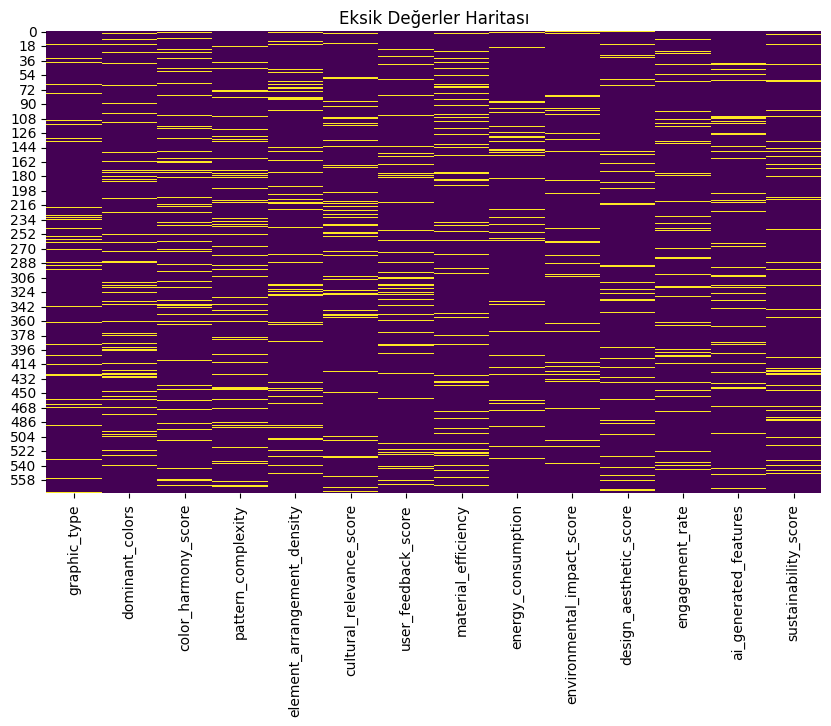

In [215]:
# Eksik değerlerin görselleştirilmesi hangi kolonda değerler nerelerde eksik
plt.figure(figsize=(10, 6))
sns.heatmap(data.isnull(), cbar=False, cmap='viridis')
plt.title("Eksik Değerler Haritası")
plt.show()

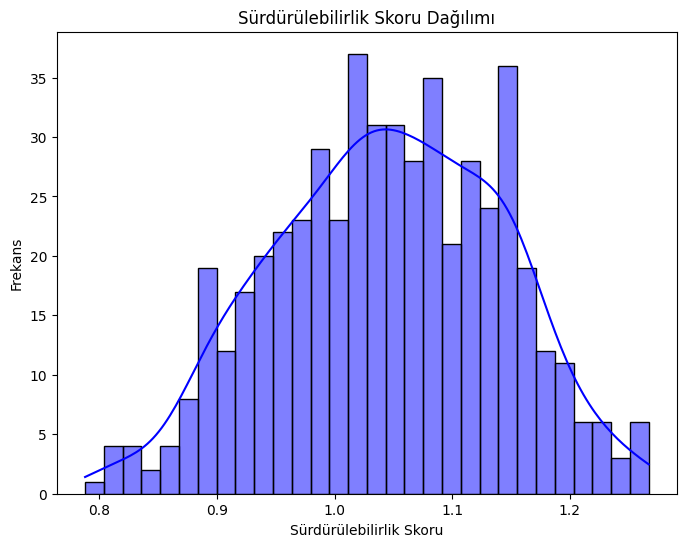

In [216]:
# Hedef değişkenin dağılımını ve sıklığını inceliyoruz
plt.figure(figsize=(8, 6))
sns.histplot(data['sustainability_score'], kde=True, color='blue', bins=30)
plt.title("Sürdürülebilirlik Skoru Dağılımı")
plt.xlabel("Sürdürülebilirlik Skoru")
plt.ylabel("Frekans")
plt.show()

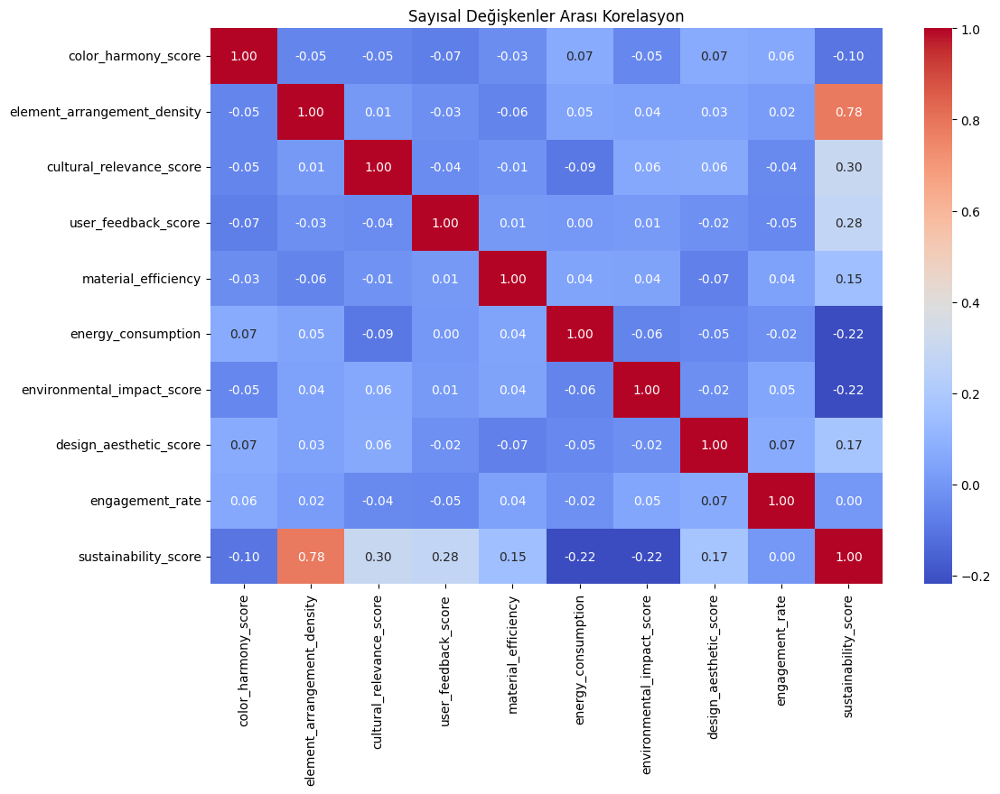

In [217]:
# Sayısal değişkenler arasındaki korelasyon ile hedef değişken ve diğer değişkenler arasındaki bağıntıları inceliyoruz
plt.figure(figsize=(12, 8))
sns.heatmap(data.select_dtypes(include=['number']).corr(), annot=True, fmt='.2f', cmap='coolwarm')
plt.title("Sayısal Değişkenler Arası Korelasyon")
plt.show()

In [218]:
# Veri Temizleme ve Ön İşleme

# Eksik değer doldurma yöntemlerini uygulayıp sonuçları bir listede saklıyoruz daha sonra bu verilere tek tek object tipindeki eksik verileri dolduracağız
imputed_data_sets = []  # Doldurulmuş veri setlerini saklayacağımız listeyi tanımlıyoruz

# Orijinal veri setini yedekle
original_data = data.copy()

# Sayısal kolonları seçiyoruz
sayisal_kolonlar = original_data.select_dtypes(include=['float64', 'int64']).columns

# Burada eksik numerik verileri farklı yöntemler ile dolduruyoruz doldurma yöntemimizi ve yeni doldurulmuş verisetimizi kaydediyoruz.

# 1. Ortalama ile Eksik Değerleri Dolduruyoruz
mean_imputer = SimpleImputer(strategy='mean')
data_mean_filled = original_data.copy()
data_mean_filled[sayisal_kolonlar] = mean_imputer.fit_transform(data_mean_filled[sayisal_kolonlar])
imputed_data_sets.append({"method": "Mean", "data": data_mean_filled})

# 2. Medyan ile Eksik Değerleri Doldurma
median_imputer = SimpleImputer(strategy='median')
data_median_filled = original_data.copy()
data_median_filled[sayisal_kolonlar] = median_imputer.fit_transform(data_median_filled[sayisal_kolonlar])
imputed_data_sets.append({"method": "Median", "data": data_median_filled})

# 3. En Sık Görülen Değer (Mod) ile Eksik Değerleri Doldurma
mode_imputer = SimpleImputer(strategy='most_frequent')
data_mode_filled = original_data.copy()
data_mode_filled[sayisal_kolonlar] = mode_imputer.fit_transform(data_mode_filled[sayisal_kolonlar])
imputed_data_sets.append({"method": "Mode", "data": data_mode_filled})

# 4. KNN İmputer ile Eksik Değerleri Doldurma
knn_imputer = KNNImputer(n_neighbors=5)
data_knn_filled = original_data.copy()
data_knn_filled[sayisal_kolonlar] = knn_imputer.fit_transform(data_knn_filled[sayisal_kolonlar])
imputed_data_sets.append({"method": "Knn", "data": data_knn_filled})

# 5. Iterative Imputer ile Eksik Değerleri Doldurma
iterative_imputer = IterativeImputer(random_state=42)
data_iterative_filled = original_data.copy()
data_iterative_filled[sayisal_kolonlar] = iterative_imputer.fit_transform(data_iterative_filled[sayisal_kolonlar])
imputed_data_sets.append({"method": "Iterative", "data": data_iterative_filled})

# 6. Rastgele Doldurma (Random Sampling)
data_random_filled = original_data.copy()
for kolon in sayisal_kolonlar:
    eksik_sayisi = data_random_filled[kolon].isnull().sum()
    if eksik_sayisi > 0:
        random_values = data_random_filled[kolon].dropna().sample(eksik_sayisi, replace=True).values
        data_random_filled.loc[data_random_filled[kolon].isnull(), kolon] = random_values
imputed_data_sets.append({"method": "Random", "data": data_random_filled})

print("Tüm eksik doldurma yöntemleri uygulanarak veri setleri bir listeye kaydedildi.")


Tüm eksik doldurma yöntemleri uygulanarak veri setleri bir listeye kaydedildi.


/usr/local/lib/python3.11/dist-packages/sklearn/impute/_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [219]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

# Burada ise daha önce numerik eksikleri doldurduğumuz verisetlerini tek tek farklı yöntemlerle eksik object türü verileri dolduruyoruz

# Tüm doldurulmuş veri setlerini saklamak için bir liste
final_imputed_data_sets = []

# Kategorik doldurma yöntemlerini tanımlıyoruz

# 1. En Sık Görülen Değer (Mod) ile Eksik Değerleri Doldurma
def fill_categorical_with_mode(data, kategorik_kolonlar):
    data_filled = data.copy()
    for kolon in kategorik_kolonlar:
        en_sik_deger = data_filled[kolon].mode()[0]
        data_filled[kolon].fillna(en_sik_deger, inplace=True)
    return data_filled

# 2. Bilinmeyen Değer ile Eksik Değerleri Doldurma
def fill_categorical_with_unknown(data, kategorik_kolonlar):
    data_filled = data.copy()
    for kolon in kategorik_kolonlar:
        data_filled[kolon].fillna('Bilinmiyor', inplace=True)
    return data_filled

# 3. Random Forest ile diğer verileri kullanarak Tahmin ile Eksik Değerleri Doldurma
def fill_categorical_with_prediction(data, kategorik_kolonlar):
    data_filled = data.copy()

    # Tüm kategorik kolonlar için LabelEncoder oluştur
    encoders = {kolon: LabelEncoder() for kolon in kategorik_kolonlar}

    # Kategorik kolonları encode ediyoruz çünkü randomforest sayısal verileri işleyebiliyor
    for kolon, encoder in encoders.items():
        # Eksik olmayan değerleri encode ediyoruz
        non_null_values = data_filled[kolon][data_filled[kolon].notnull()]
        data_filled.loc[data_filled[kolon].notnull(), kolon] = encoder.fit_transform(non_null_values)

    for kolon in kategorik_kolonlar:
        train_data = data_filled[data_filled[kolon].notnull()]
        test_data = data_filled[data_filled[kolon].isnull()]

        if not test_data.empty:
            rf_model = RandomForestClassifier(random_state=42)
            rf_model.fit(train_data.drop(columns=[kolon]), train_data[kolon].astype(int))  # Modeli eğitiyoruz

            # Eksik değerlerin tahmin ediyoruz
            tahminler = rf_model.predict(test_data.drop(columns=[kolon]))
            data_filled.loc[data_filled[kolon].isnull(), kolon] = tahminler

    # Kategorik kolonları geri decode ediyoruz
    for kolon, encoder in encoders.items():
        data_filled[kolon] = encoder.inverse_transform(data_filled[kolon].astype(int))

    return data_filled

# Her sayısal doldurma yöntemi için kategorik doldurma yöntemlerini uygulayacağız
for imputed_data in imputed_data_sets:
    numeric_method = imputed_data["method"]  # Sayısal doldurma yöntemi adını alıyoruz
    data = imputed_data["data"]             # Doldurulmuş veri setini alıyoruz

    # 1. Mod ile Kategorik Doldurma
    data_mod_filled = fill_categorical_with_mode(data, kategorik_kolonlar)
    final_imputed_data_sets.append({
        "numeric_method": numeric_method,
        "categorical_method": "Mode",
        "data": data_mod_filled
    })

    # 2. "Bilinmiyor" ile Kategorik Doldurma
    data_unknown_filled = fill_categorical_with_unknown(data, kategorik_kolonlar)
    final_imputed_data_sets.append({
        "numeric_method": numeric_method,
        "categorical_method": "Unknown",
        "data": data_unknown_filled
    })

    # 3. Tahmine Dayalı Kategorik Doldurma
    data_predicted_filled = fill_categorical_with_prediction(data, kategorik_kolonlar)
    final_imputed_data_sets.append({
        "numeric_method": numeric_method,
        "categorical_method": "Prediction",
        "data": data_predicted_filled
    })

print("Tüm kombinasyonlarla doldurulmuş veri setleri oluşturuldu.")


<ipython-input-219-95397478d0bb>:16: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_filled[kolon].fillna(en_sik_deger, inplace=True)
<ipython-input-219-95397478d0bb>:23: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)',

Tüm kombinasyonlarla doldurulmuş veri setleri oluşturuldu.


In [220]:
# Veri Setimizin Son Halini Kısaca İnceliyoruz
final_imputed_data_sets

[{'numeric_method': 'Mean',
  'categorical_method': 'Mode',
  'data':     graphic_type dominant_colors  color_harmony_score pattern_complexity  \
  0    Arrangement            Warm             0.775504                Low   
  1    Arrangement            Warm             0.803199                Low   
  2    Combination            Warm             0.610073               High   
  3    Combination            Warm             0.818017               High   
  4          Color            Cool             0.803199             Medium   
  ..           ...             ...                  ...                ...   
  570  Combination            Warm             0.621605             Medium   
  571  Arrangement            Cool             0.921476             Medium   
  572        Color            Warm             0.863387               High   
  573  Combination            Warm             0.608792             Medium   
  574  Combination         Neutral             0.725962             Medium

In [221]:
# Eksik değerleri doldurduktan sonra kontrol ediyoruz.
print("\nEksik Değerler Doldurulduktan Sonra:")
for dataset in final_imputed_data_sets:
  print(dataset['data'].isnull().sum())


Eksik Değerler Doldurulduktan Sonra:
graphic_type                   0
dominant_colors                0
color_harmony_score            0
pattern_complexity             0
element_arrangement_density    0
cultural_relevance_score       0
user_feedback_score            0
material_efficiency            0
energy_consumption             0
environmental_impact_score     0
design_aesthetic_score         0
engagement_rate                0
ai_generated_features          0
sustainability_score           0
dtype: int64
graphic_type                   0
dominant_colors                0
color_harmony_score            0
pattern_complexity             0
element_arrangement_density    0
cultural_relevance_score       0
user_feedback_score            0
material_efficiency            0
energy_consumption             0
environmental_impact_score     0
design_aesthetic_score         0
engagement_rate                0
ai_generated_features          0
sustainability_score           0
dtype: int64
graphic_type

In [222]:
# Kategorik değişkenlerini işleyebilmek için sayısal değere çevirerek kodluyoruz.

for dataset in final_imputed_data_sets:
  df = dataset['data']

  kategorik_kolonlar = df.select_dtypes(include=['object']).columns # Object(Kategorik) türü kolonları seçiyoruz
  etiket_kodlayicilar = {}
  for kolon in kategorik_kolonlar:
      etiket_kodlayici = LabelEncoder()
      df[kolon] = etiket_kodlayici.fit_transform(data[kolon]) # LabelEncoder ile kategorik verileri sayısal verilere dönüştürüyoruz
      etiket_kodlayicilar[kolon] = etiket_kodlayici

  print("\nDönüştürülmüş Veri Örnekleri:")
  print(df.head()) # Yüzeysel olarak kontrol ediyoruz


Dönüştürülmüş Veri Örnekleri:
   graphic_type  dominant_colors  color_harmony_score  pattern_complexity  \
0             0                2             0.775504                   1   
1             0                2             0.803199                   1   
2             2                3             0.610073                   0   
3             2                2             0.818017                   0   
4             1                0             0.803199                   2   

   element_arrangement_density  cultural_relevance_score  user_feedback_score  \
0                     0.320958                  0.753838             4.319294   
1                     0.536288                  0.938278             5.449704   
2                     0.641996                  0.742532             8.768979   
3                     0.322817                  0.870381             7.800752   
4                     0.274770                  0.981712             3.601174   

   material_efficie

In [223]:
# Numerik(Sayısal) Özelliklerin ölçeklendirilmesi

for dataset in final_imputed_data_sets:
  df = dataset['data']
  sayisal_kolonlar = df.select_dtypes(include=['float64', 'int64']).columns
  olcekleyici = StandardScaler()  # Standart Scaler ile verilerimizi ölçeklendiriyoruz
  df[sayisal_kolonlar] = olcekleyici.fit_transform(df[sayisal_kolonlar])

  print("\nÖlçeklendirilmiş Veri Örnekleri:")
  print(df.head())


Ölçeklendirilmiş Veri Örnekleri:
   graphic_type  dominant_colors  color_harmony_score  pattern_complexity  \
0     -1.218515         0.719074        -2.424831e-01           -0.224606   
1     -1.218515         0.719074         9.720558e-16           -0.224606   
2      0.854402         1.696538        -1.690910e+00           -1.218054   
3      0.854402         0.719074         1.297370e-01           -1.218054   
4     -0.182056        -1.235855         9.720558e-16            0.768843   

   element_arrangement_density  cultural_relevance_score  user_feedback_score  \
0                    -0.861478                  0.078632            -0.205728   
1                     0.000000                  1.361385             0.208614   
2                     0.422909                  0.000000             1.425263   
3                    -0.854042                  0.889168             1.070369   
4                    -1.046263                  1.663457            -0.468948   

   material_effi

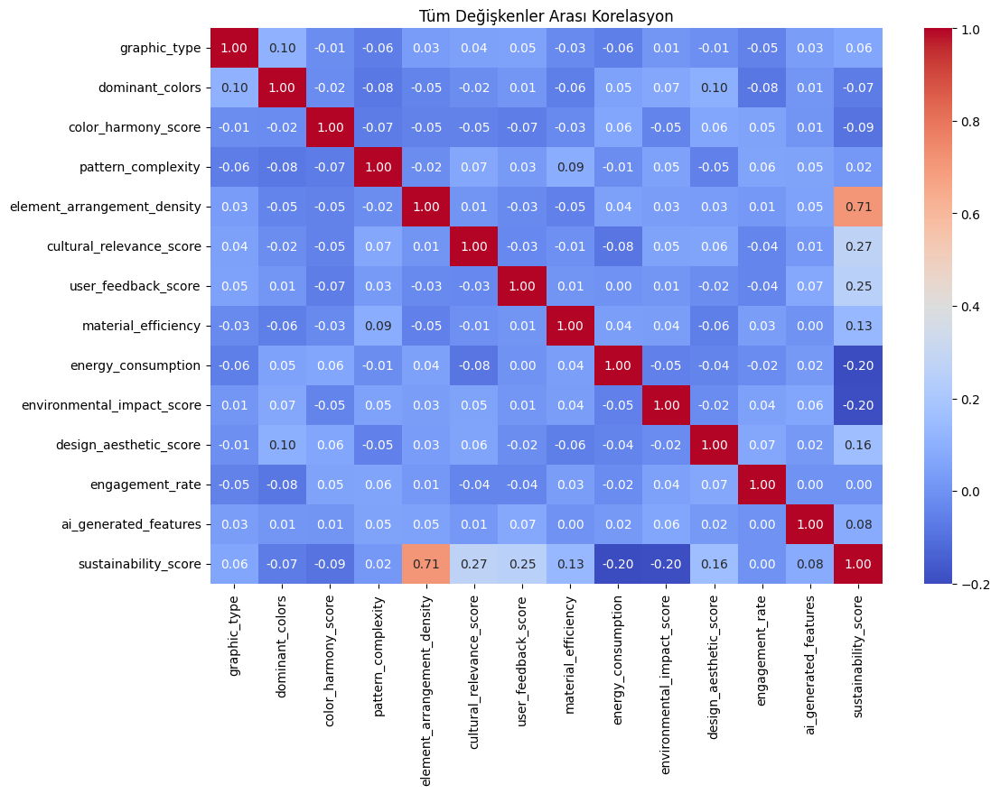

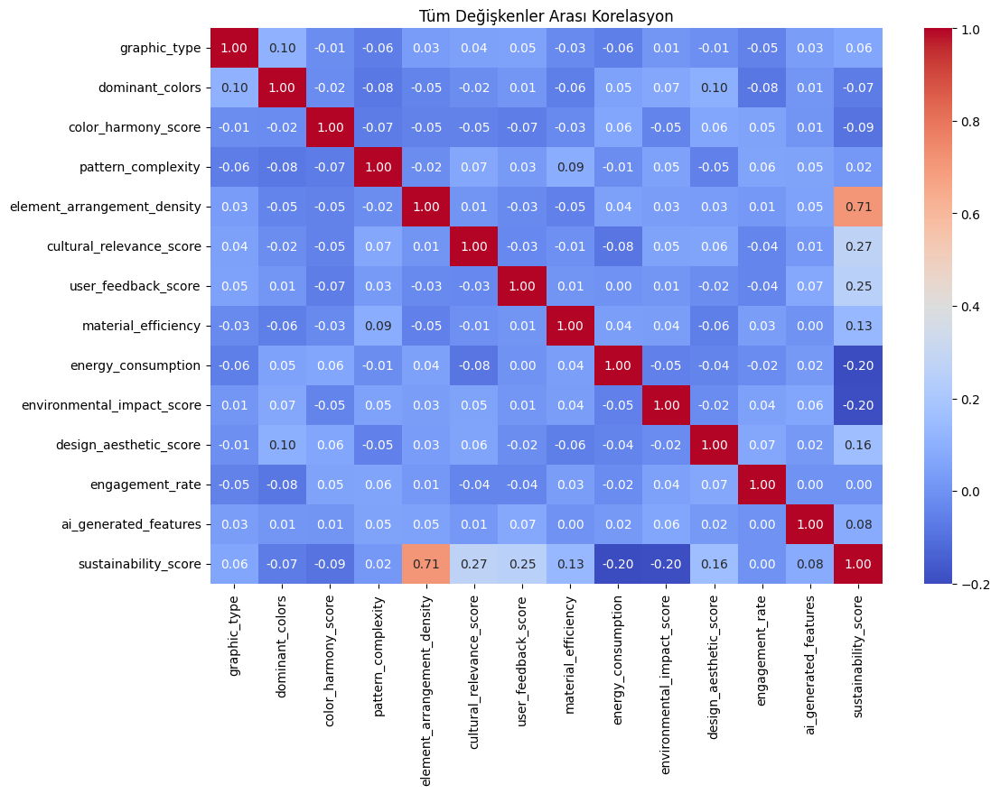

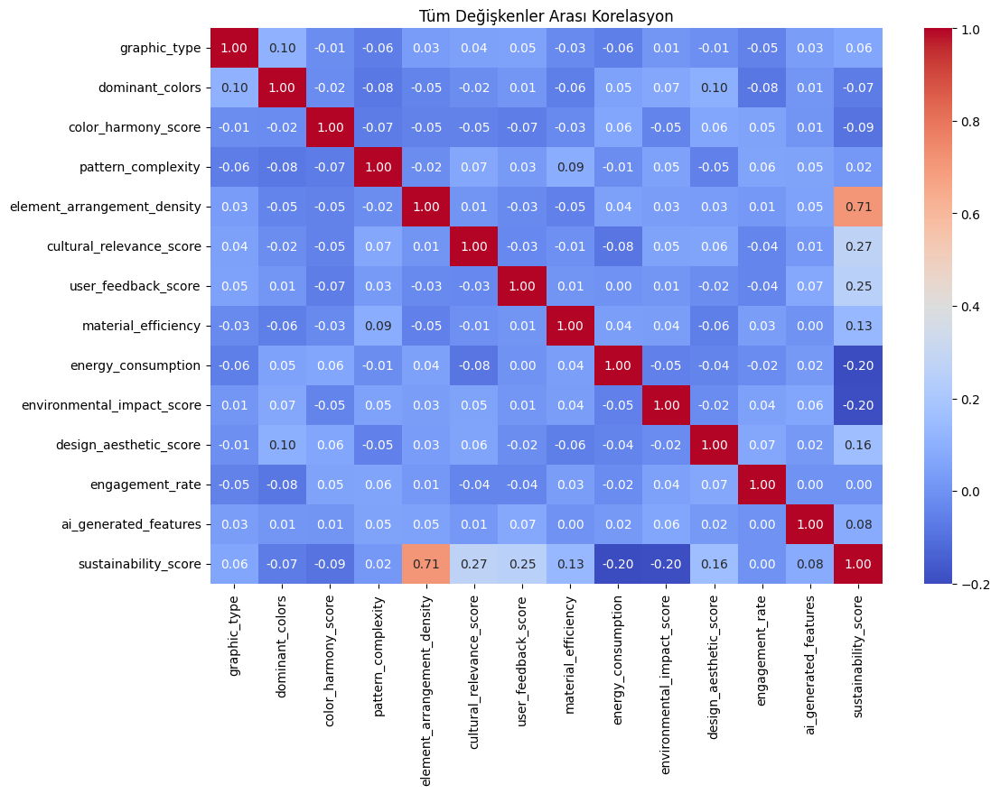

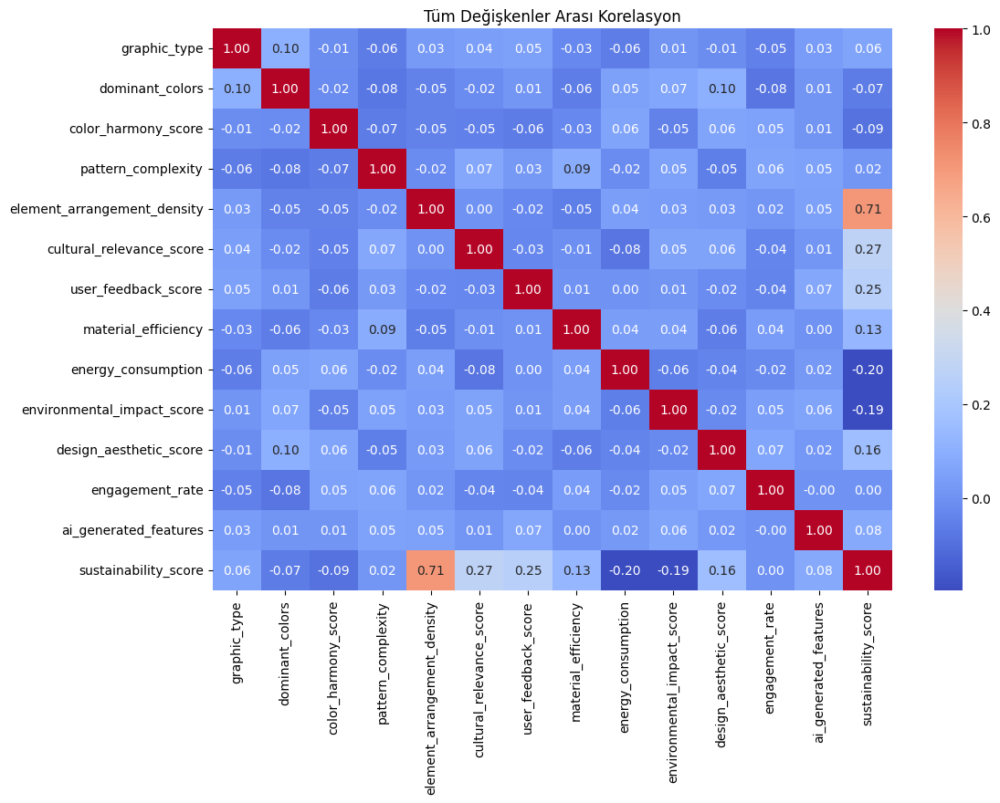

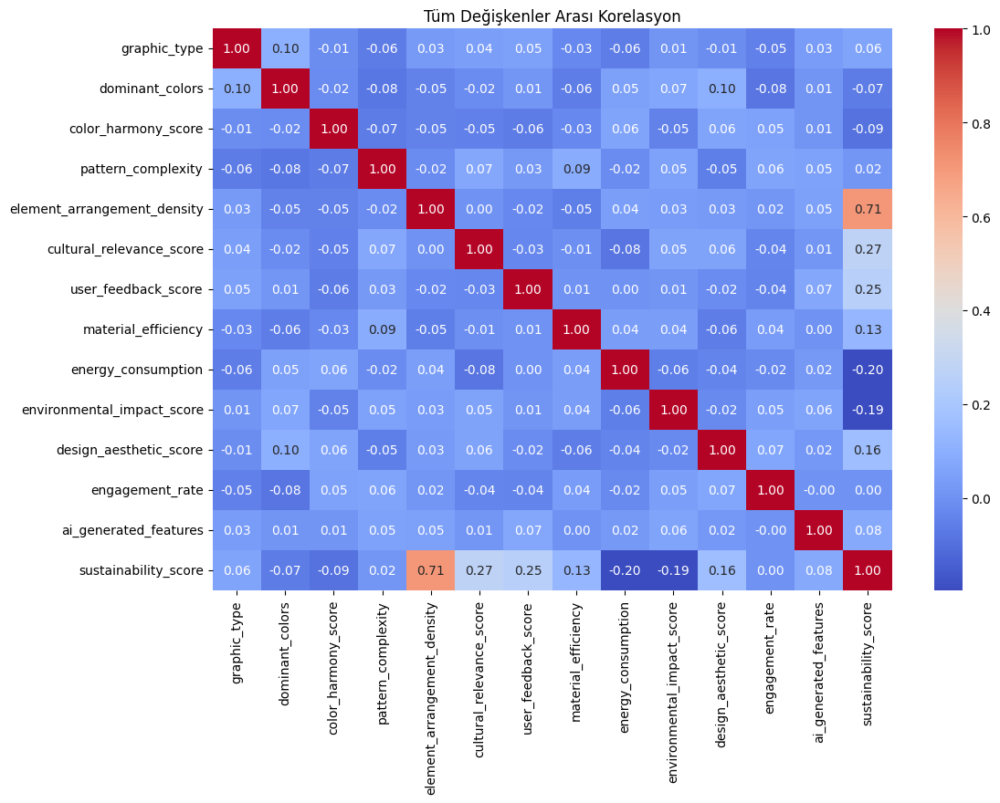

...

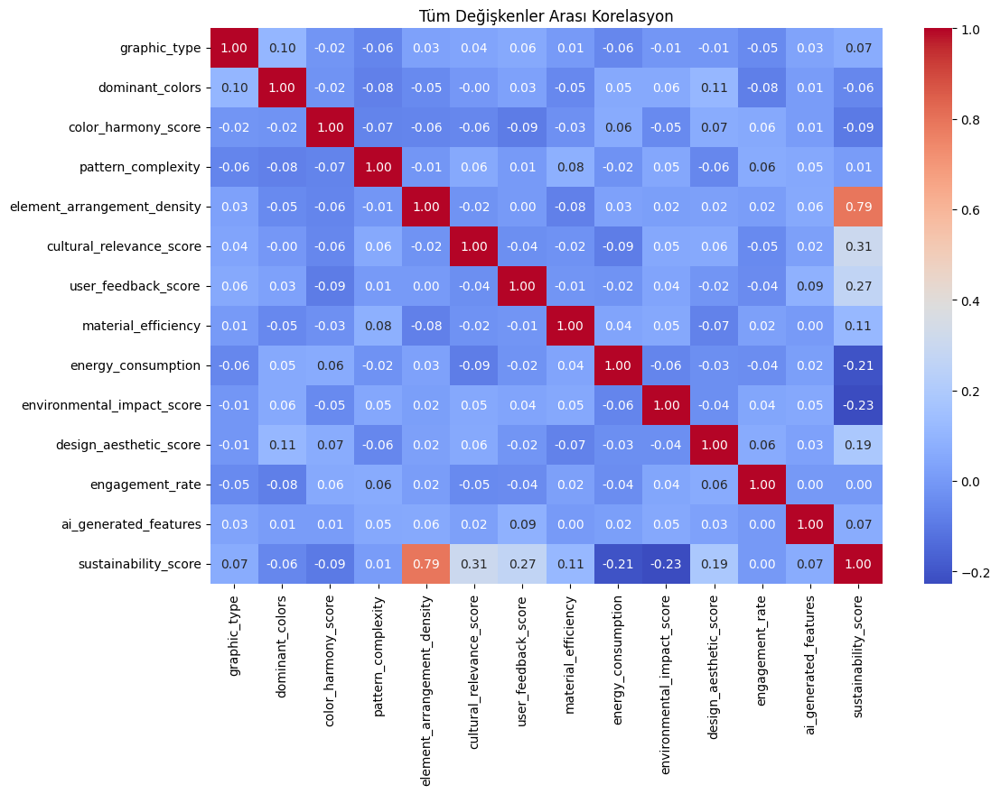

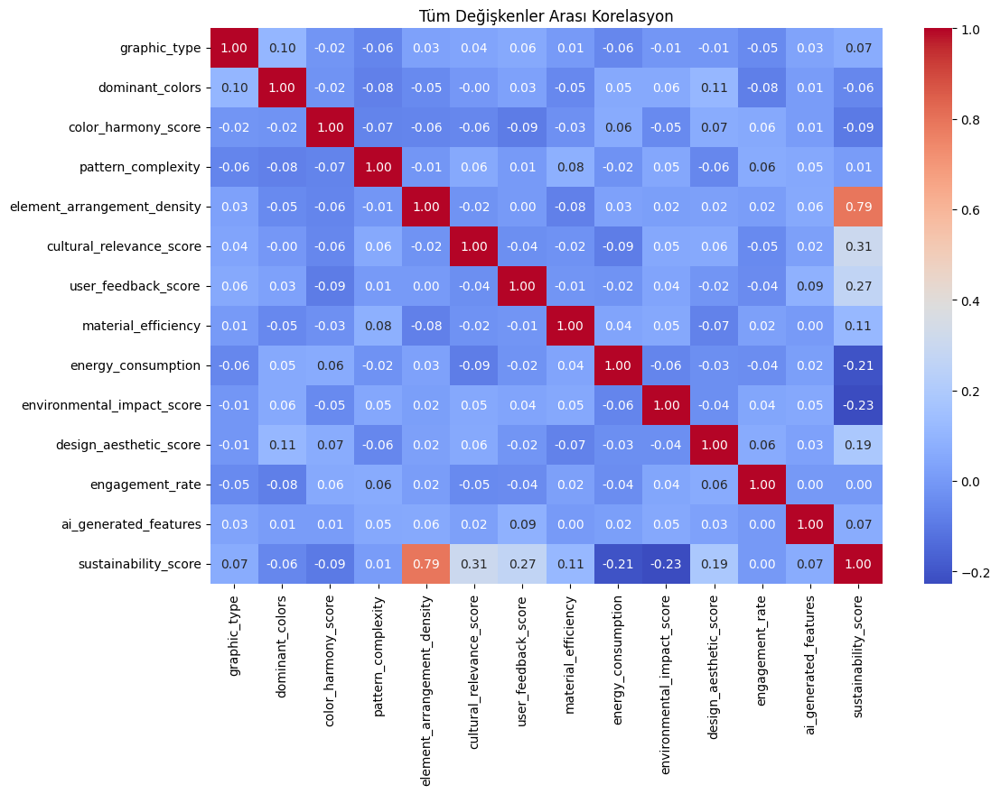

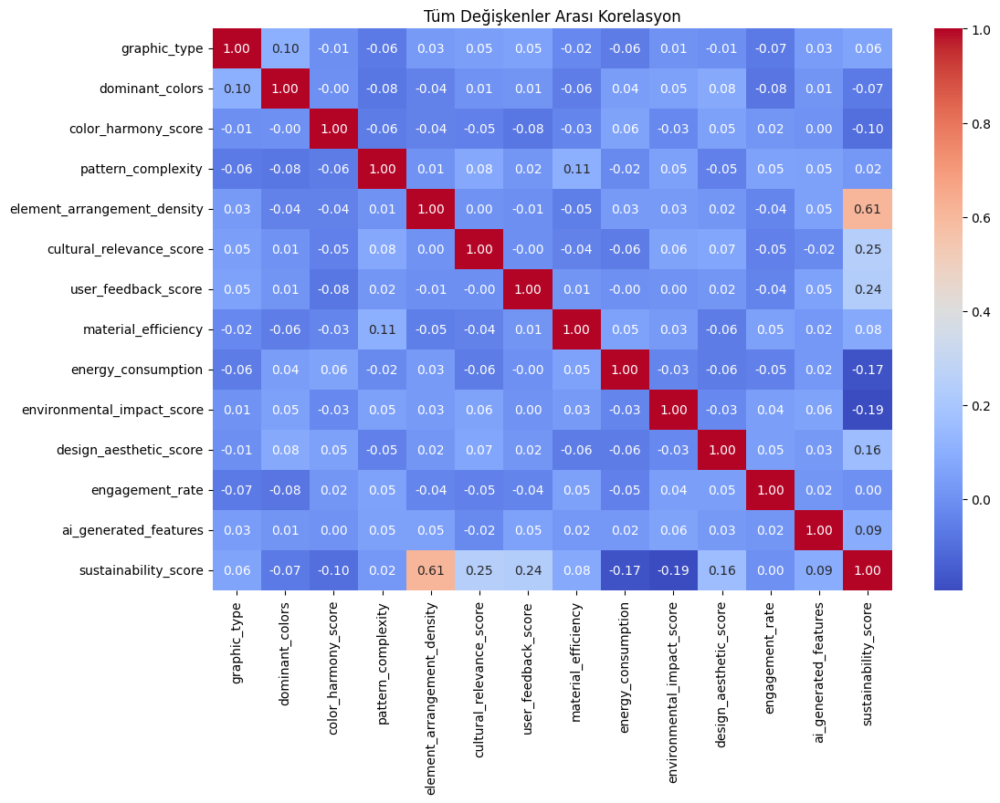

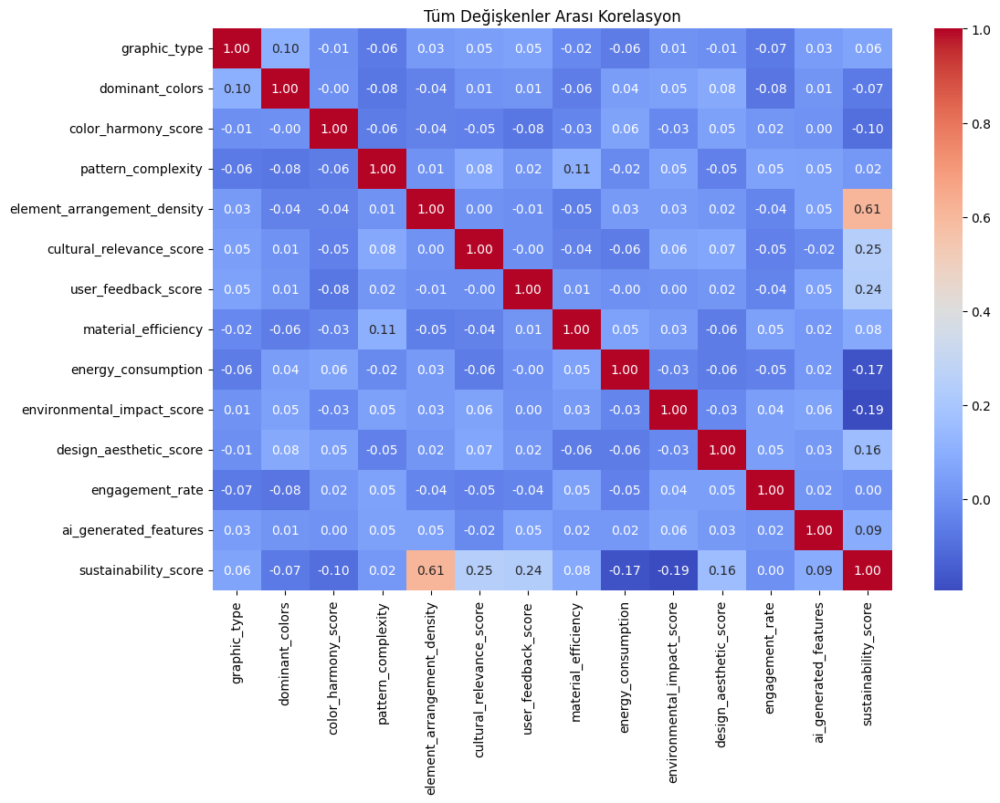

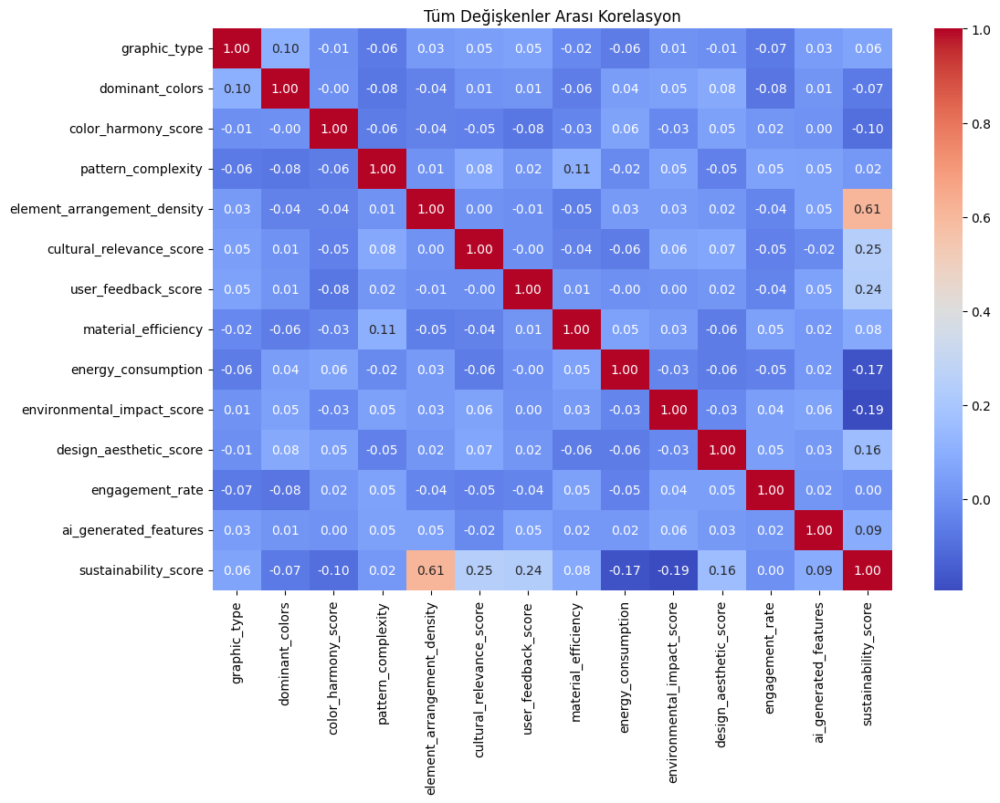

In [224]:
# Tüm değişkenler arasındaki korelasyon

for dataset in final_imputed_data_sets:
  df = dataset['data']
  plt.figure(figsize=(12, 8))
  sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap='coolwarm')
  plt.title("Tüm Değişkenler Arası Korelasyon")
  plt.show()

#**Yeni Türetilen Kolonlar:**

###*cultural_relevance_score* ve *user_feedback_score*:
Bu iki kolon benzer bir etkiye sahip (toplumsal bağlam ve kullanıcı geri bildirimleri). Bunların bir ortalaması veya toplamı, kullanıcı etkileşimi ve toplumsal bağlamı birleştiren bir özellik *social_impact_score* olarak birleştirilebilir.

###*material_efficiency* ve *energy_consumption*:
Kaynakların verimli kullanımı ve enerji tüketimi birbirleriyle ilişkili olabilir. Aralarındaki fark veya oran, üretim verimliliğini gösterebilir. Bu yüzden yeni bir kolonda *resource_efficiency* adıyla toplayabiliriz.

###*design_aesthetic_score* ve *element_arrangement_density*:
Tasarım estetiği ve düzen yoğunluğu birlikte bir görsel kalite metriği oluşturabilir bunuda *visual_quality_score* ismiyle toplayabiliriz.

In [225]:
# Yeni kolonlar türetme

for dataset in final_imputed_data_sets:

  dataset['data']["social_impact_score"] = (dataset['data']["cultural_relevance_score"] + dataset['data']["user_feedback_score"]) / 2
  dataset['data']["resource_efficiency"] = dataset['data']["material_efficiency"] - dataset['data']["energy_consumption"]
  #Bu satırda diğerlerinden farklı bir işlem yapmamızın nedeni, material_efficiency (malzeme verimliliği) ve energy_consumption (enerji tüketimi) özelliklerinin doğası gereği birbirine ters ilişki göstermesidir. Yani:
  #Malzeme verimliliği (material_efficiency): Daha yüksek olması, sürdürülebilirliği olumlu etkiler.
  #Enerji tüketimi (energy_consumption): Daha düşük olması, sürdürülebilirliği olumlu etkiler.
  dataset['data']["visual_quality_score"] = (dataset['data']["design_aesthetic_score"] + dataset['data']["element_arrangement_density"]) / 2

In [226]:
# Atılacak kolonlar : Bu kolonlar korelasyon matrisinde hedef sütunumuzla düşük ilişkisi anlamı olmayan kolonlardır.
columns_to_drop = [
    "color_harmony_score",
    "graphic_type",
    "dominant_colors",
    "engagement_rate",
    "ai_generated_features",
    "pattern_complexity"
]

# Seçtiğimiz kolonları atıyoruz
for dataset in final_imputed_data_sets:
  dataset['data'] = dataset['data'].drop(columns=columns_to_drop)

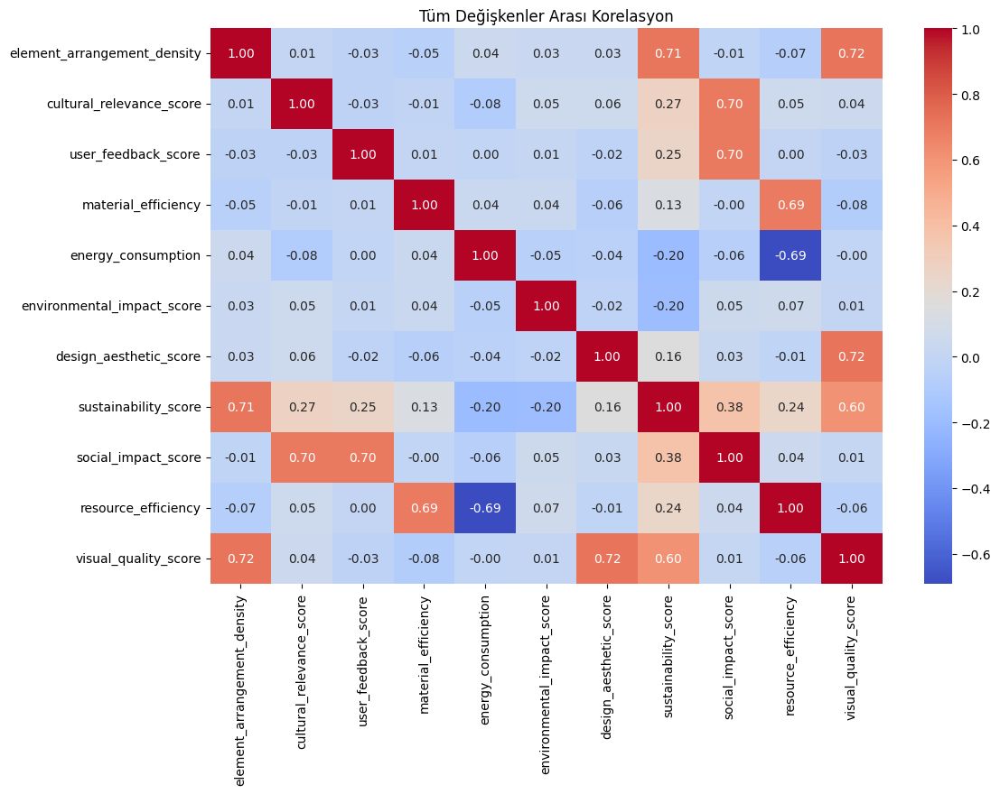

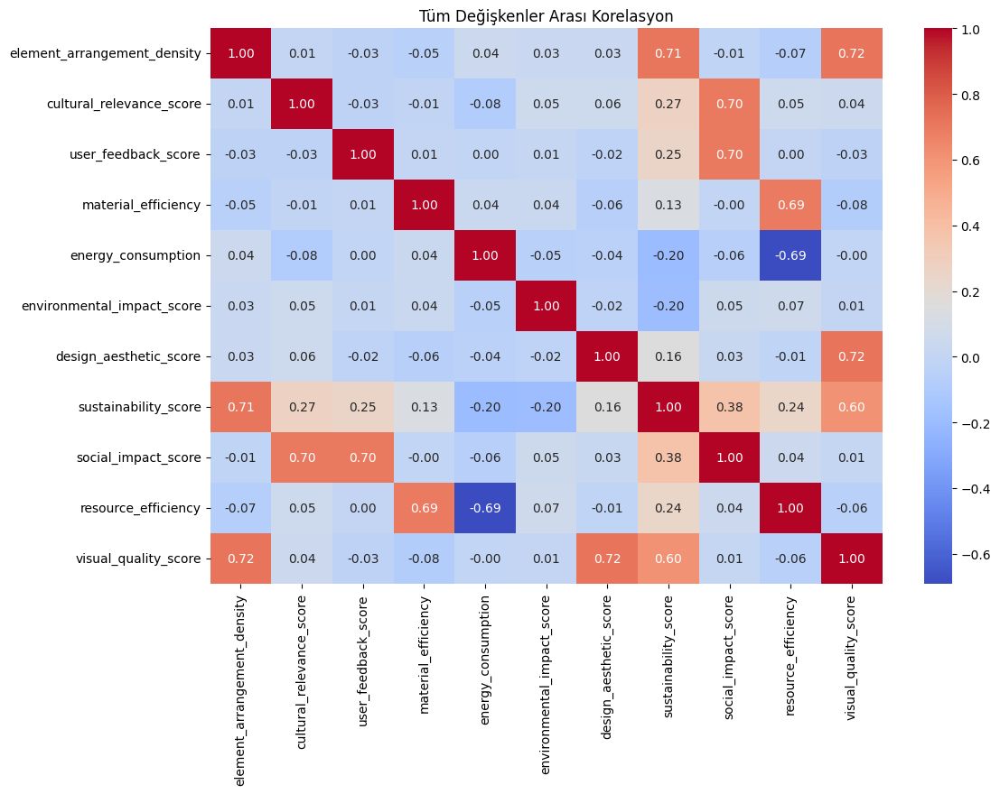

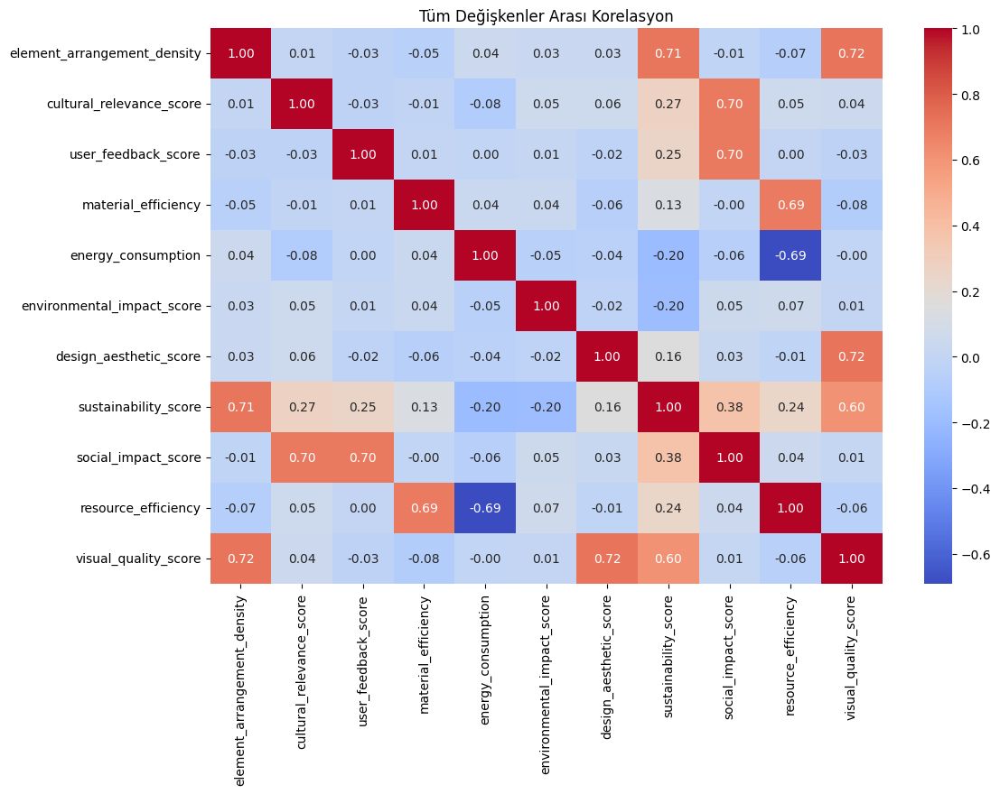

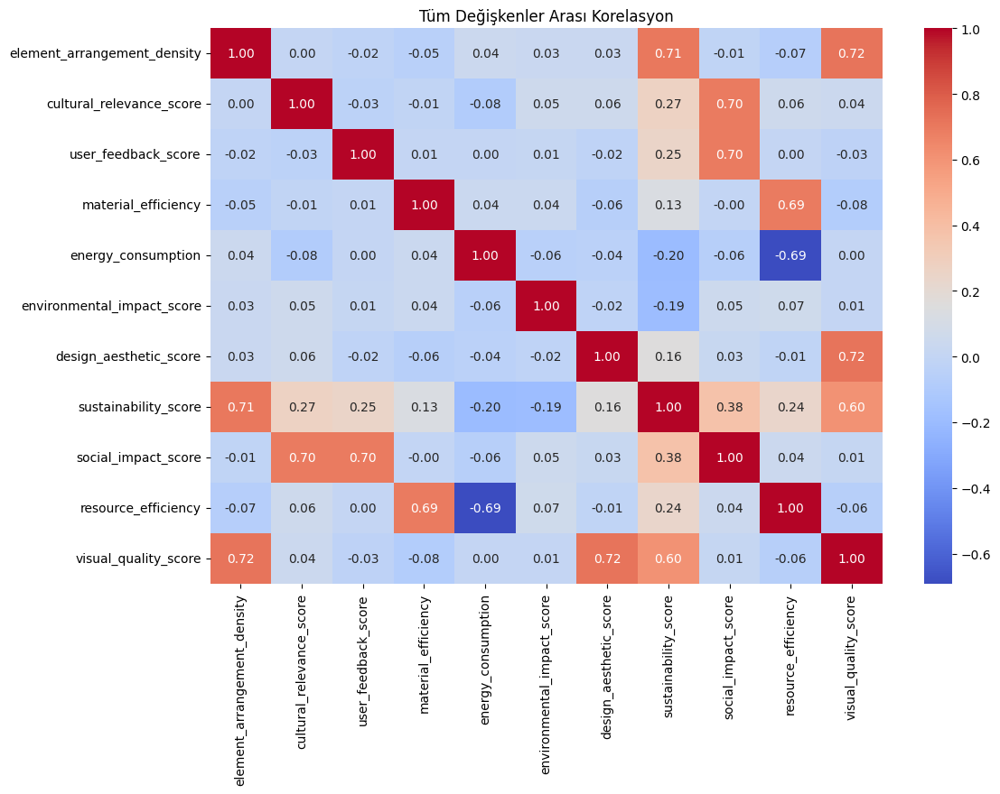

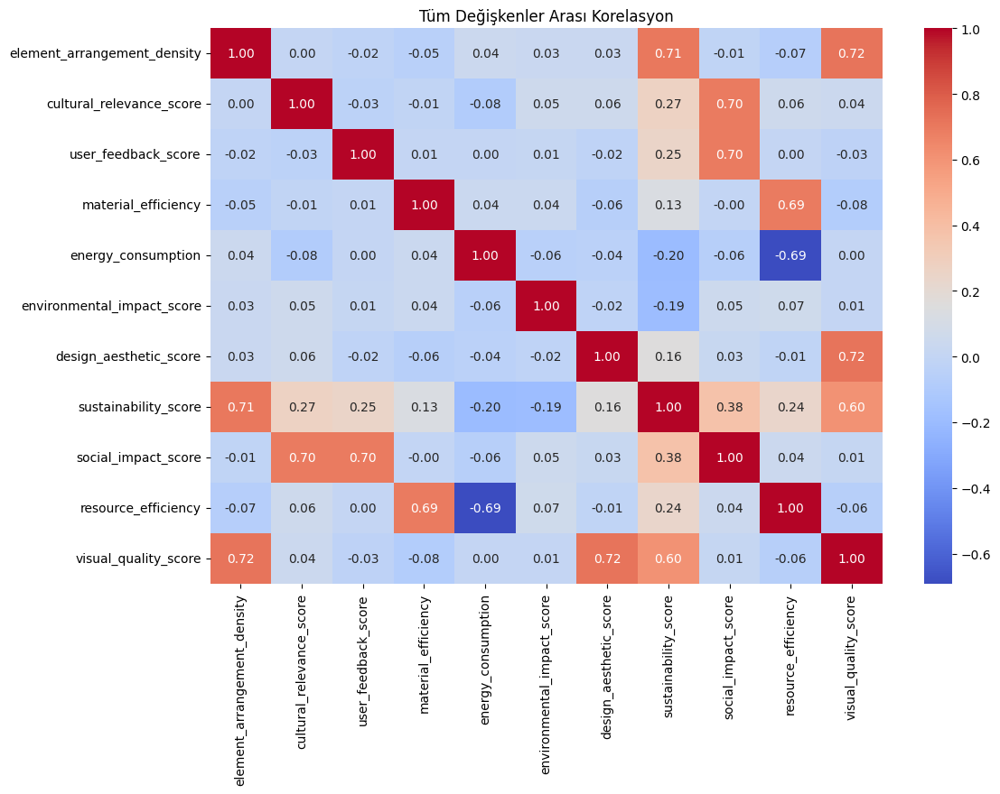

...

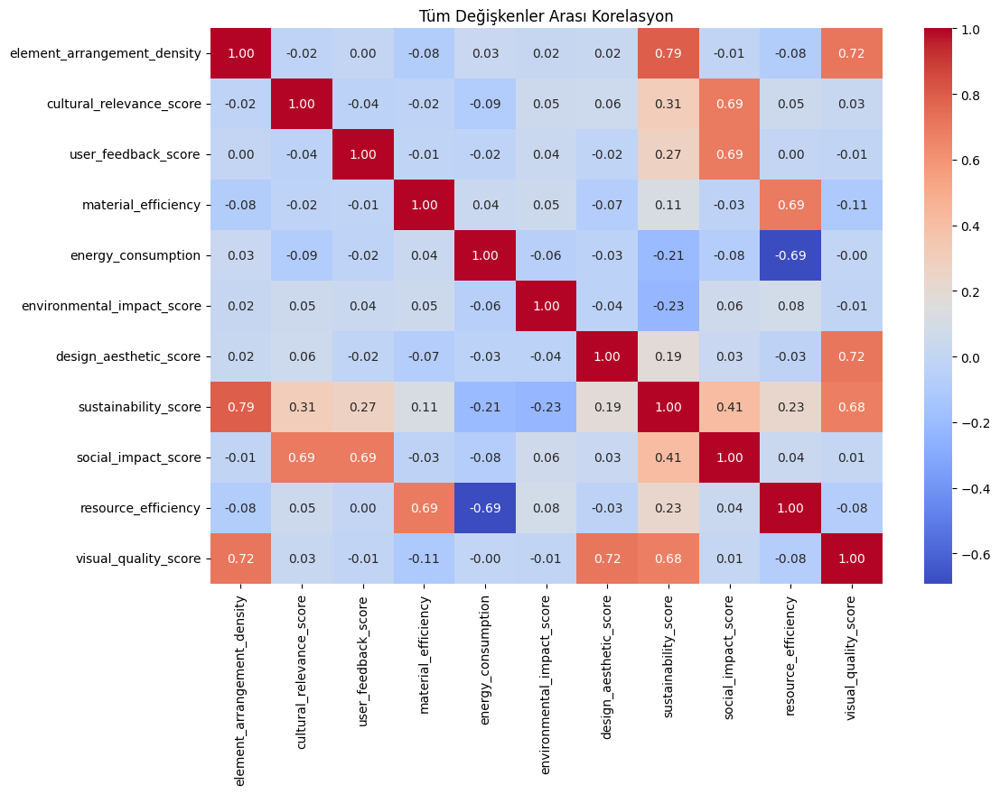

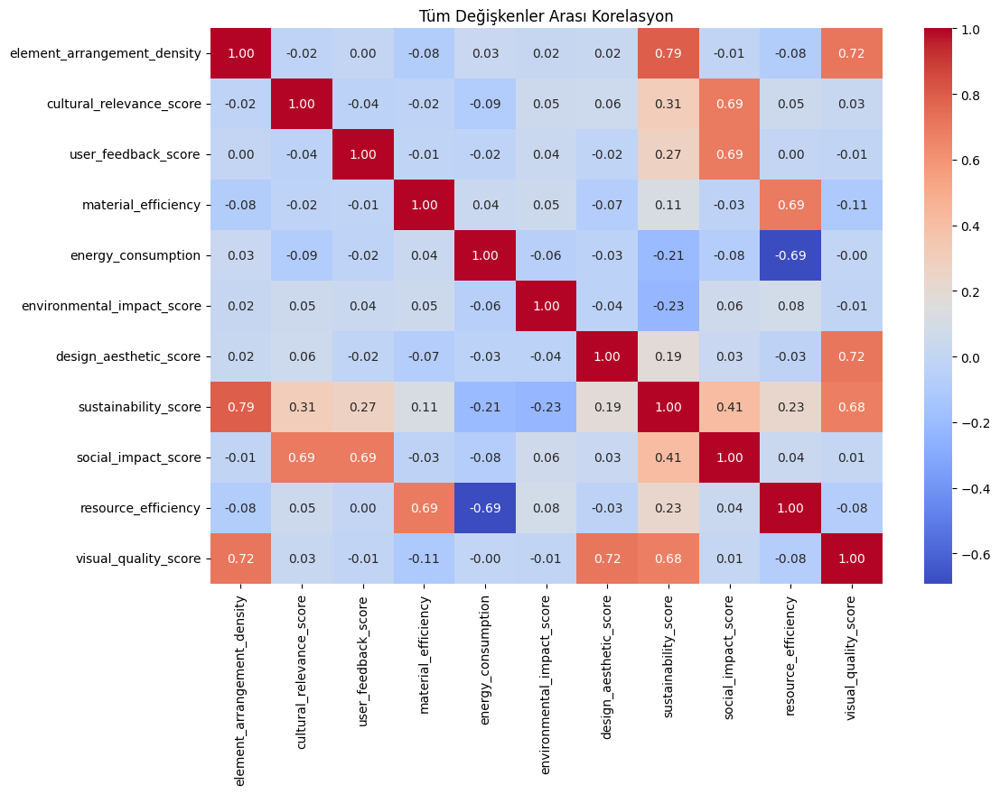

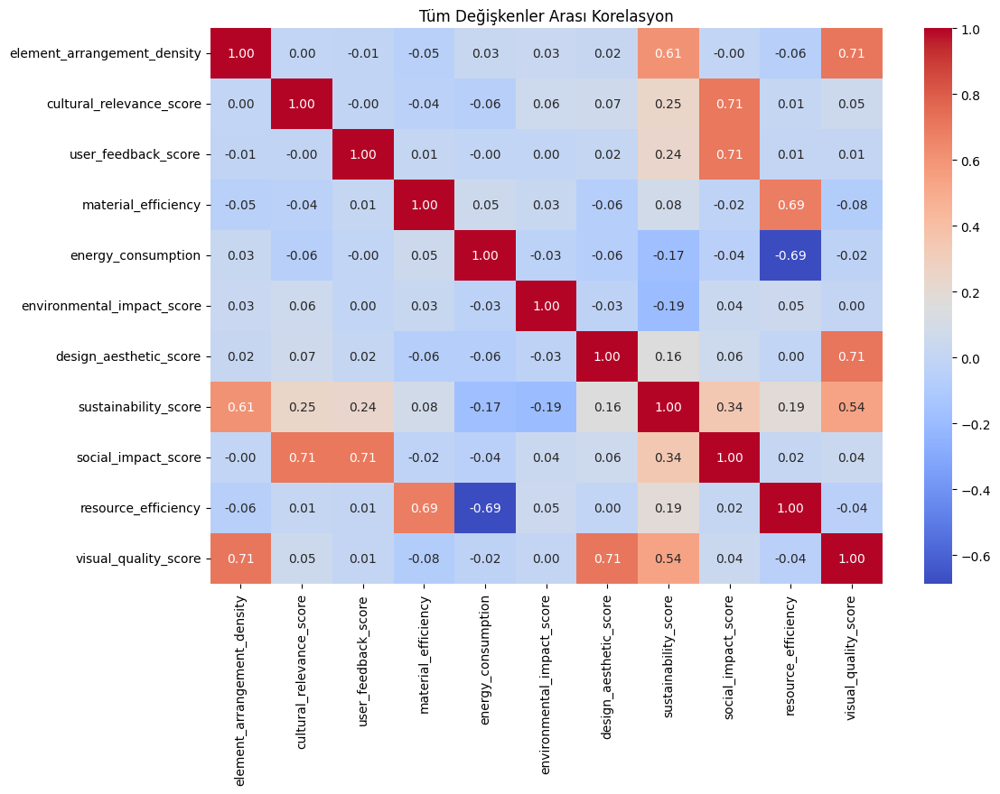

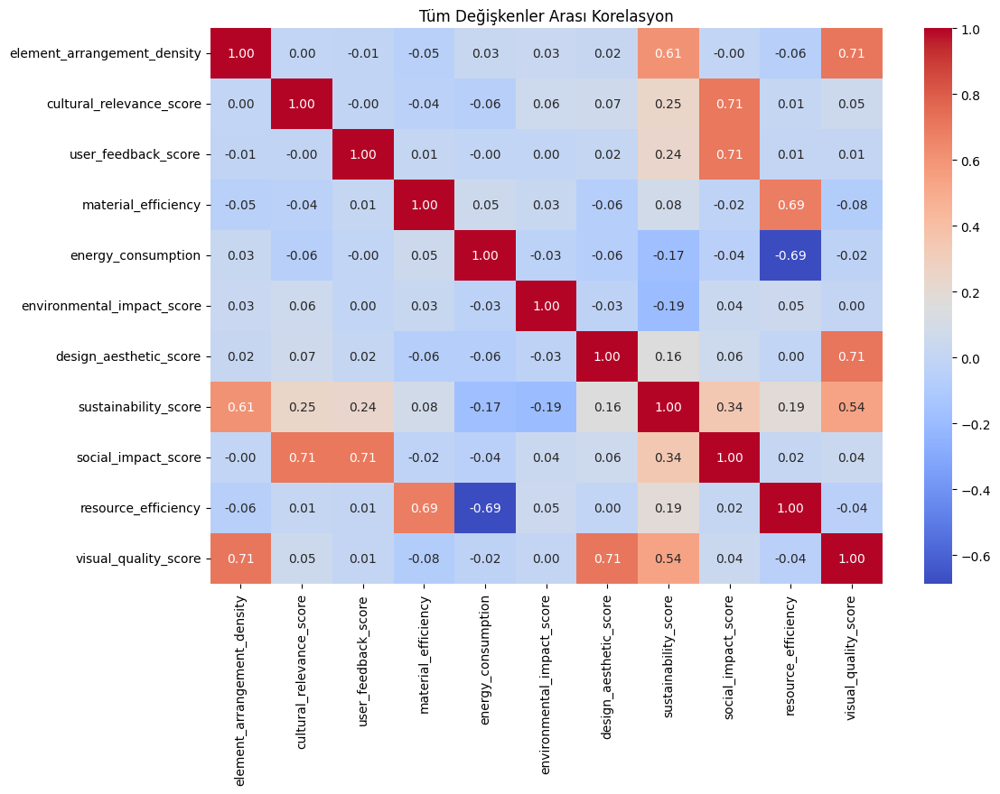

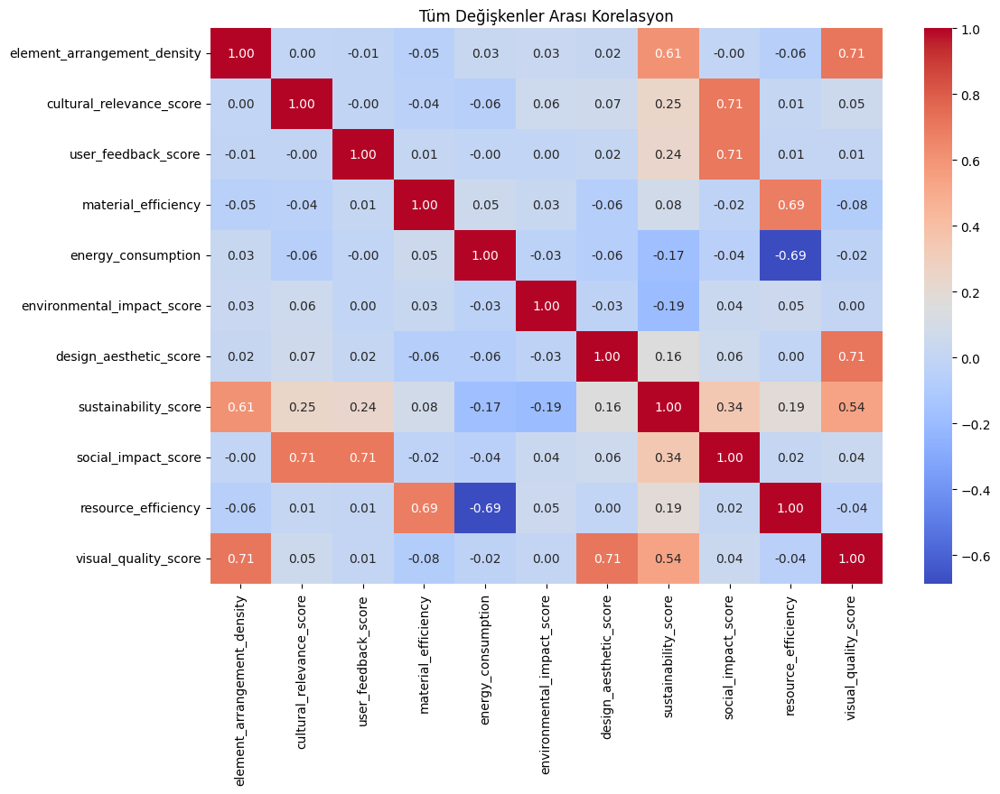

In [227]:
# Tüm değişkenler arasındaki korelasyonu tekrar inceliyoruz

for dataset in final_imputed_data_sets:
  df = dataset['data']
  plt.figure(figsize=(12, 8))
  sns.heatmap(df.corr(), annot=True, fmt='.2f', cmap='coolwarm')
  plt.title("Tüm Değişkenler Arası Korelasyon")
  plt.show()

In [228]:
# Verileri Ayırma Ve Modelleri Eğitip Tahmin Yapma
sonuclar = {}

for dataset in final_imputed_data_sets:
  # Hedef değişken ve özelliklerin tanımlıyoruz
  target = 'sustainability_score'  # Hedef değişkenimiz
  X = dataset['data'].drop(columns=[target])
  y = dataset['data'][target]

  # Eğitim ve test setlerini ayırıyoruz
  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

  # Modellerimizi tanımlıyoruz
  modeller = {
      "Linear Regresyon": LinearRegression(),
      "Random Forest": RandomForestRegressor(random_state=42),
      "Destek Vektör Regresyonu": SVR(),
      "XGBoost": XGBRegressor(random_state=42)
  }

  # Modellerin eğitimi, tahminler ve metrikler ile değerlendirilmesi

  for model_adi, model in modeller.items():
      model.fit(X_train, y_train)
      y_pred = model.predict(X_test)

      # Performans değerlendirme metrikleri
      mae = mean_absolute_error(y_test, y_pred)
      mse = mean_squared_error(y_test, y_pred)
      rmse = np.sqrt(mse)
      r2 = r2_score(y_test, y_pred)

      # Metriklerimizi ve verilerimizi ölçümler için kaydediyoruz
      sonuclar[model_adi+ " " +dataset['numeric_method']+ " " +dataset['categorical_method']] = {
          "MAE": mae,
          "MSE": mse,
          "RMSE": rmse,
          "R2": r2,
          "test": y_test,
          "pred": y_pred
      }

In [229]:
# Sonuçları yazdırıyoruz.
print("\nModel Değerlendirme Sonuçları:")
sonuc_df = pd.DataFrame(sonuclar).T
print(sonuc_df)


Model Değerlendirme Sonuçları:
                                                 MAE       MSE      RMSE  \
Linear Regresyon Mean Mode                  0.263229  0.159484  0.399355   
Random Forest Mean Mode                     0.350449  0.211054  0.459406   
Destek Vektör Regresyonu Mean Mode          0.322112  0.194495  0.441016   
XGBoost Mean Mode                           0.353886  0.221983  0.471151   
Linear Regresyon Mean Unknown               0.263229  0.159484  0.399355   
...                                              ...       ...       ...   
XGBoost Random Unknown                      0.452739  0.443743   0.66614   
Linear Regresyon Random Prediction          0.377137  0.344457  0.586905   
Random Forest Random Prediction             0.439577  0.396051  0.629326   
Destek Vektör Regresyonu Random Prediction  0.366241  0.356927  0.597434   
XGBoost Random Prediction                   0.452739  0.443743   0.66614   

                                                  R2  \

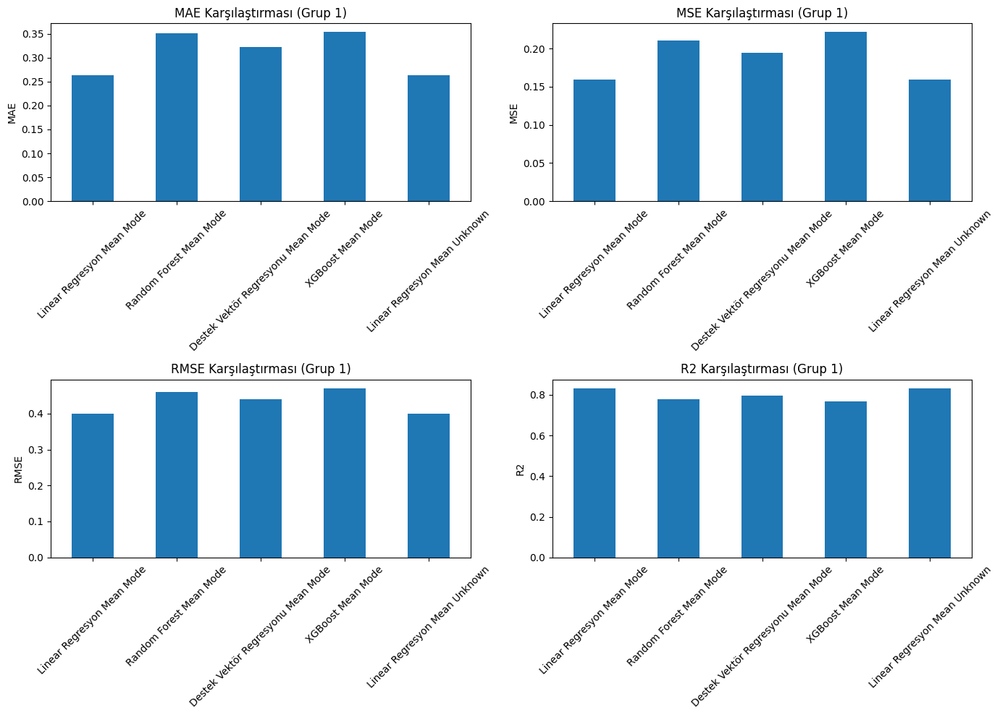

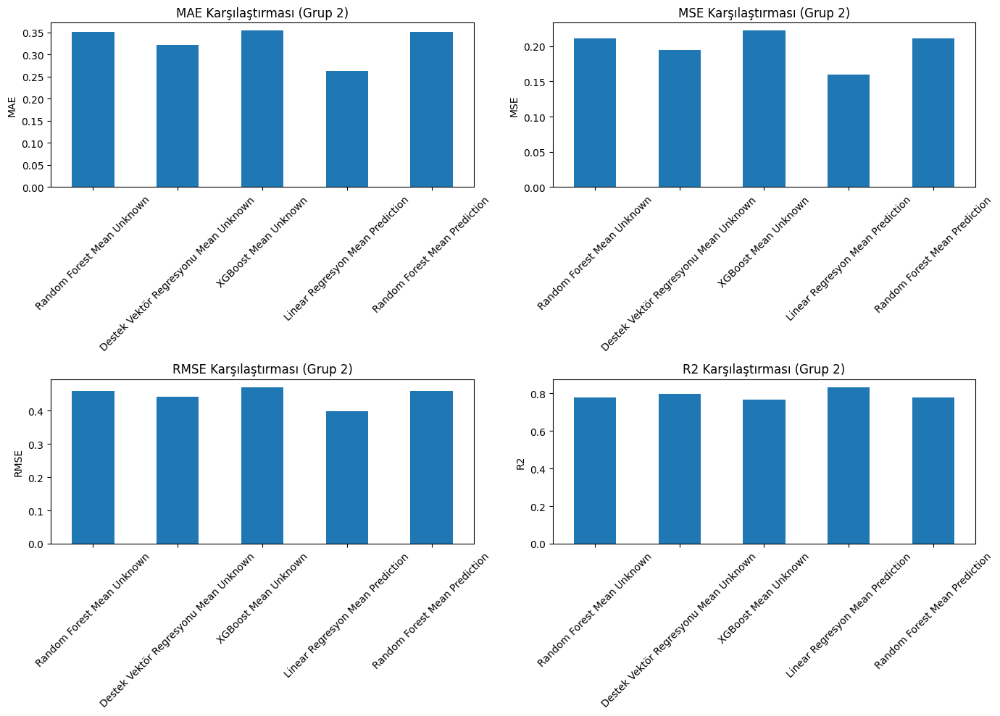

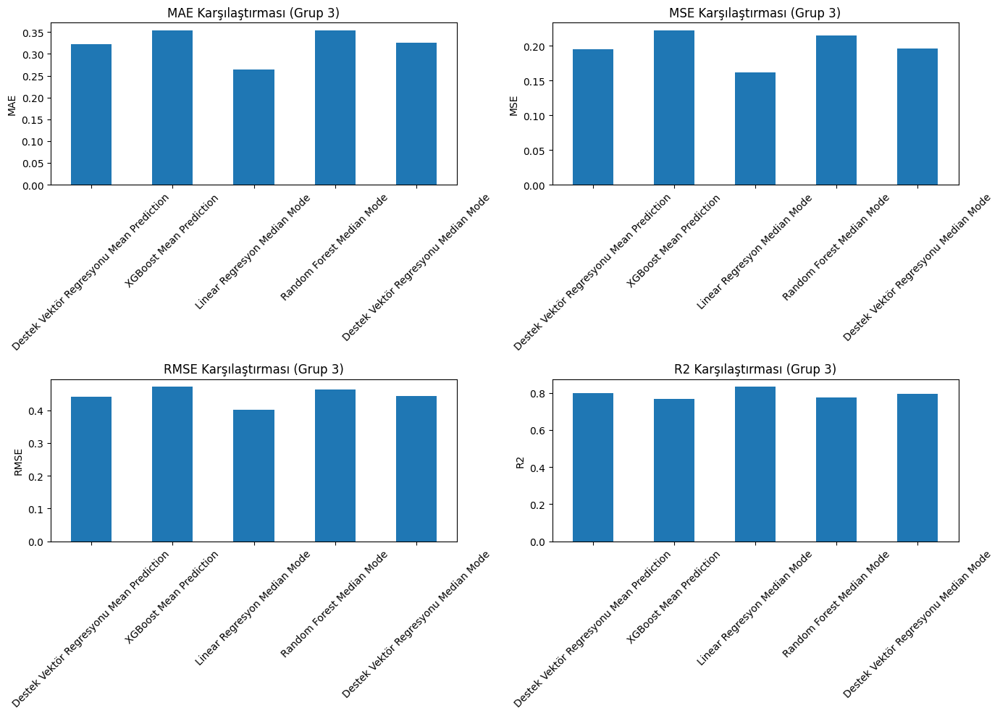

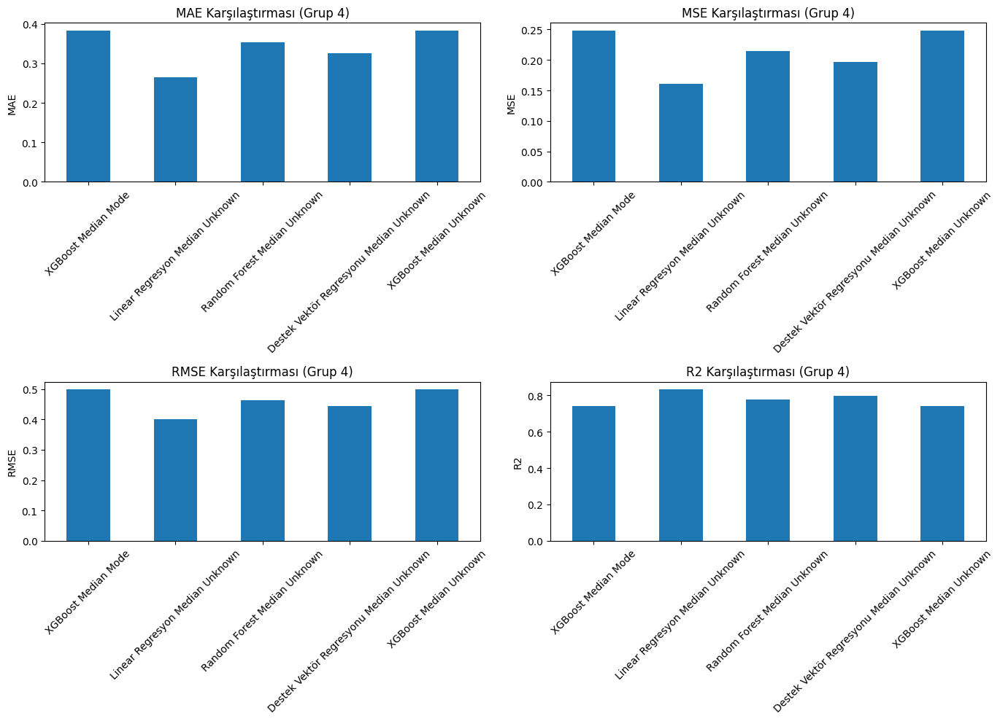

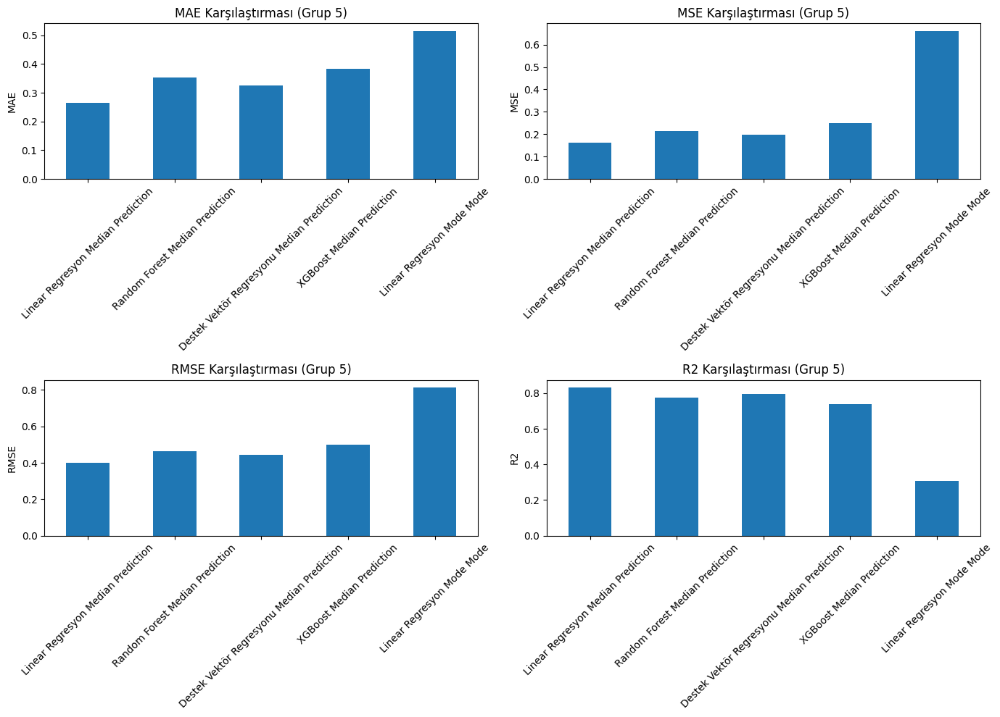

...

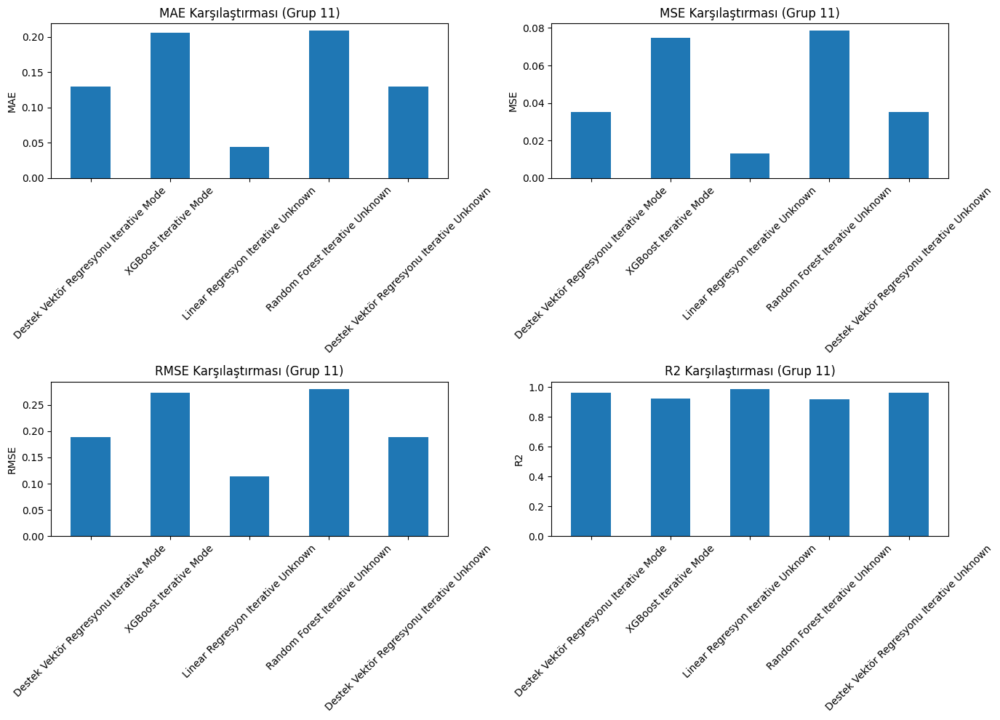

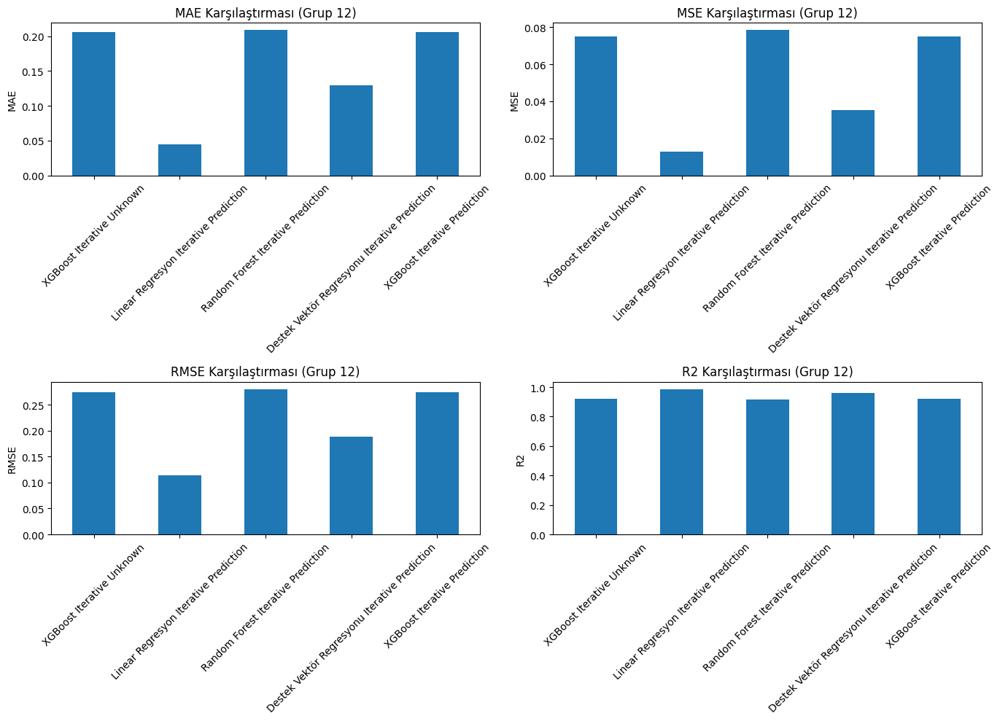

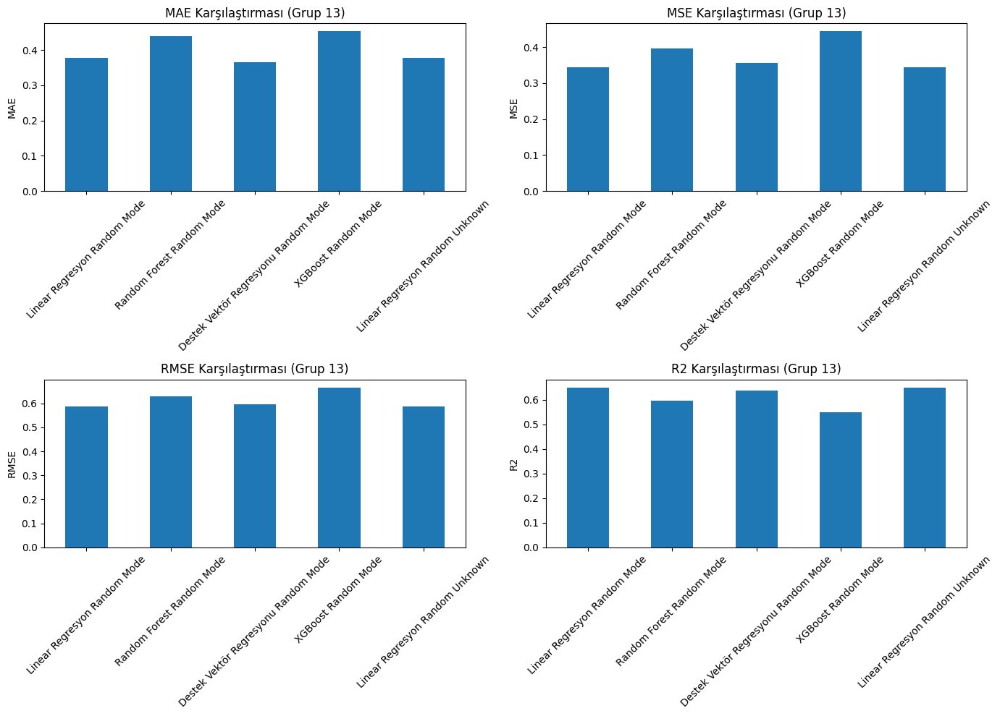

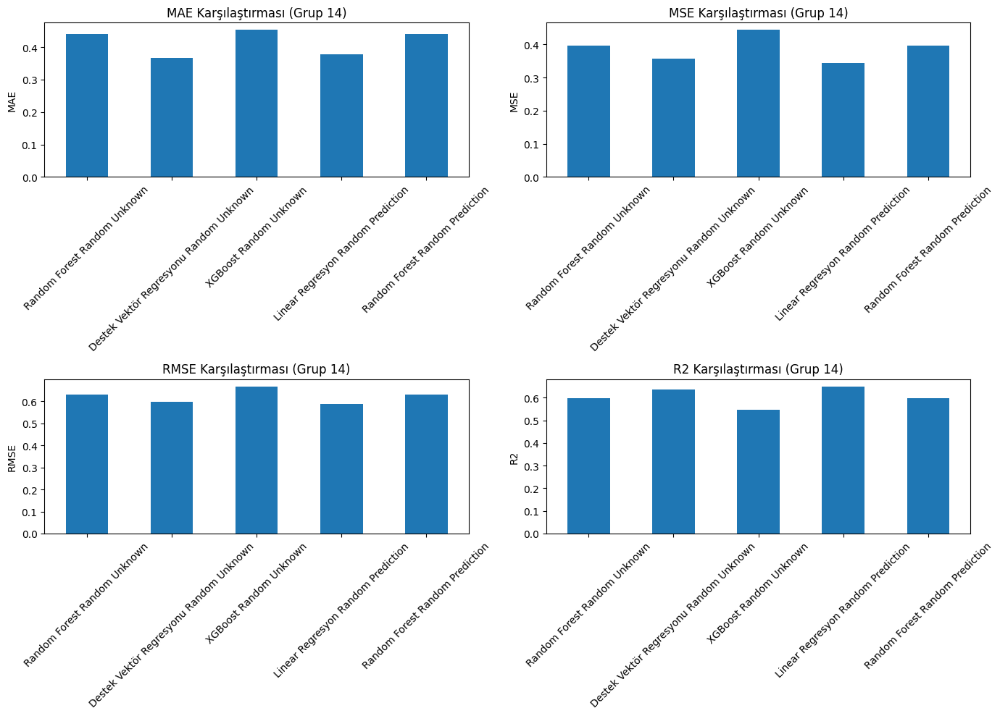

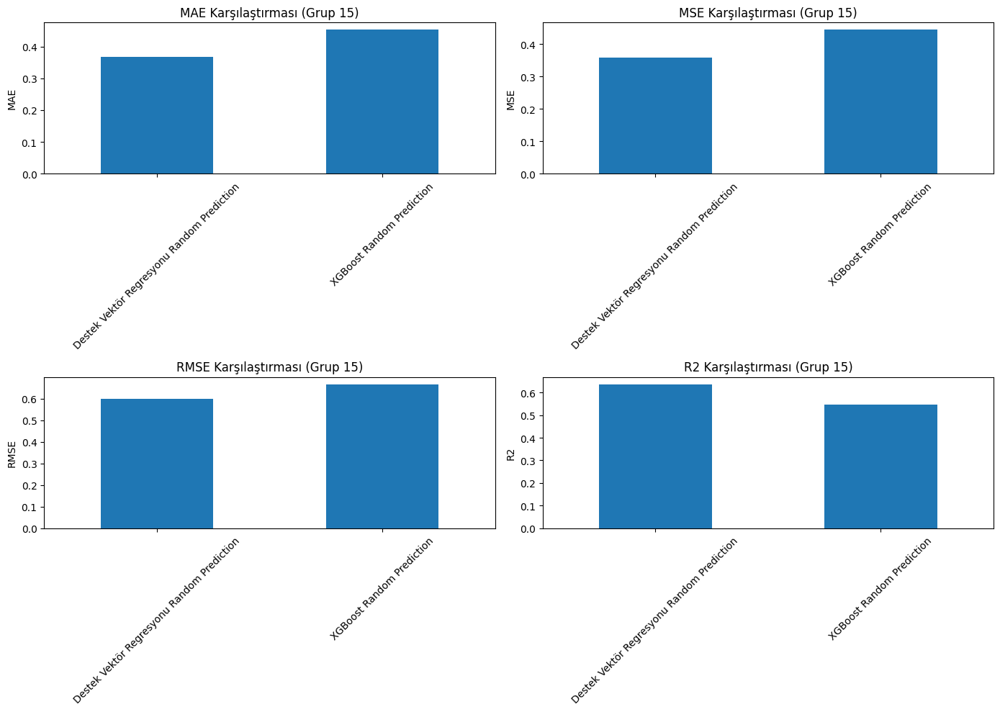

In [230]:
# Sonuçların Görselleştirilmesi ve Karşılaştırılması

# Çok fazla sonucumuz olduğundan dolayı anlaşılabilirlik için grafikleri grup grup ayırıyoruz
group_size = 5  # Her grupta kaç model olacağını belirliyoruz
metrics = ["MAE", "MSE", "RMSE", "R2"]  # Çizilecek metrikleri seçiyoruz.

# Sonuçları gruplayarak her grup için grafik oluşturuyoruz.
for i in range(0, len(sonuc_df), group_size):
    group_df = sonuc_df.iloc[i:i + group_size]  # Parça parça grupları alıyoruz.

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Her metrik için ayrı bar grafikler çizdiriyoruz.
    for idx, metric in enumerate(metrics):
        ax = axes[idx//2, idx%2]
        group_df[metric].plot(kind='bar', ax=ax)
        ax.set_title(f'{metric} Karşılaştırması (Grup {i//group_size + 1})')
        ax.set_ylabel(metric)
        ax.set_xticklabels(group_df.index, rotation=45)

    # Oluşturulan grafikleri ekrana bastırıyoruz.
    plt.tight_layout()
    plt.show()

In [231]:
# En iyi modeli bulmak için metriklere göre sıralama yapıyoruz

# En küçük MAE, MSE, RMSE ve en büyük R2'yi bulan fonksiyonu tanımladık
def find_best_models(sonuclar):
    best_models = {}

    # MAE, MSE, RMSE için en küçük değeri, R2 için ise en büyük değeri alıyoruz
    best_models["En İyi MAE"] = sonuc_df["MAE"].idxmin()  # En küçük MAE
    best_models["En İyi MSE"] = sonuc_df["MSE"].idxmin()  # En küçük MSE
    best_models["En İyi RMSE"] = sonuc_df["RMSE"].idxmin()  # En küçük RMSE
    best_models["En İyi R2"] = sonuc_df["R2"].idxmax()  # En büyük R2

    return best_models

# En iyi sonuçları veren modelleri buluyoruz
best_models = find_best_models(sonuclar)

# Sonuçları yazdırıyoruz
print("En İyi Modeller:")
for metric, model in best_models.items():
    print(f"{metric}: {model}")

sonuc_df["R2"]

En İyi Modeller:
En İyi MAE: Linear Regresyon Iterative Mode
En İyi MSE: Linear Regresyon Iterative Mode
En İyi RMSE: Linear Regresyon Iterative Mode
En İyi R2: Linear Regresyon Iterative Mode


,R2
Linear Regresyon Mean Mode,0.833482
Random Forest Mean Mode,0.779639
Destek Vektör Regresyonu Mean Mode,0.796927
XGBoost Mean Mode,0.768227
Linear Regresyon Mean Unknown,0.833482
...,...
XGBoost Random Unknown,0.547679
Linear Regresyon Random Prediction,0.648884
Random Forest Random Prediction,0.596293
Destek Vektör Regresyonu Random Prediction,0.636173


In [232]:
sonuc_df

,MAE,MSE,RMSE,R2,test,pred
Linear Regresyon Mean Mode,0.263229,0.159484,0.399355,0.833482,153 -1.532023e+00 118 -1.725749e+00 245 ...,"[-1.576092935374631, -1.7459992549155727, 0.31..."
Random Forest Mean Mode,0.350449,0.211054,0.459406,0.779639,153 -1.532023e+00 118 -1.725749e+00 245 ...,"[-1.218140014432719, -1.4190981394708395, 0.40..."
Destek Vektör Regresyonu Mean Mode,0.322112,0.194495,0.441016,0.796927,153 -1.532023e+00 118 -1.725749e+00 245 ...,"[-1.7610949506344715, -1.784864845594068, 0.48..."
XGBoost Mean Mode,0.353886,0.221983,0.471151,0.768227,153 -1.532023e+00 118 -1.725749e+00 245 ...,"[-1.1655388, -1.8866886, 0.29808924, -0.937420..."
Linear Regresyon Mean Unknown,0.263229,0.159484,0.399355,0.833482,153 -1.532023e+00 118 -1.725749e+00 245 ...,"[-1.576092935374631, -1.7459992549155727, 0.31..."
...,...,...,...,...,...,...
XGBoost Random Unknown,0.452739,0.443743,0.66614,0.547679,153 -1.475276 118 -1.659407 245 0.59604...,"[-1.3968093, -0.9699523, 0.020585593, -0.86873..."
Linear Regresyon Random Prediction,0.377137,0.344457,0.586905,0.648884,153 -1.475276 118 -1.659407 245 0.59604...,"[-1.4004398109415974, -1.6491081193017343, 0.2..."
Random Forest Random Prediction,0.439577,0.396051,0.629326,0.596293,153 -1.475276 118 -1.659407 245 0.59604...,"[-1.1018674562010542, -1.35764196686695, 0.427..."
Destek Vektör Regresyonu Random Prediction,0.366241,0.356927,0.597434,0.636173,153 -1.475276 118 -1.659407 245 0.59604...,"[-1.5815810156899706, -1.6719474568849728, 0.5..."


MAE     0.044738
MSE     0.012963
RMSE    0.113856
R2       0.98627
Name: Linear Regresyon Iterative Mode, dtype: object


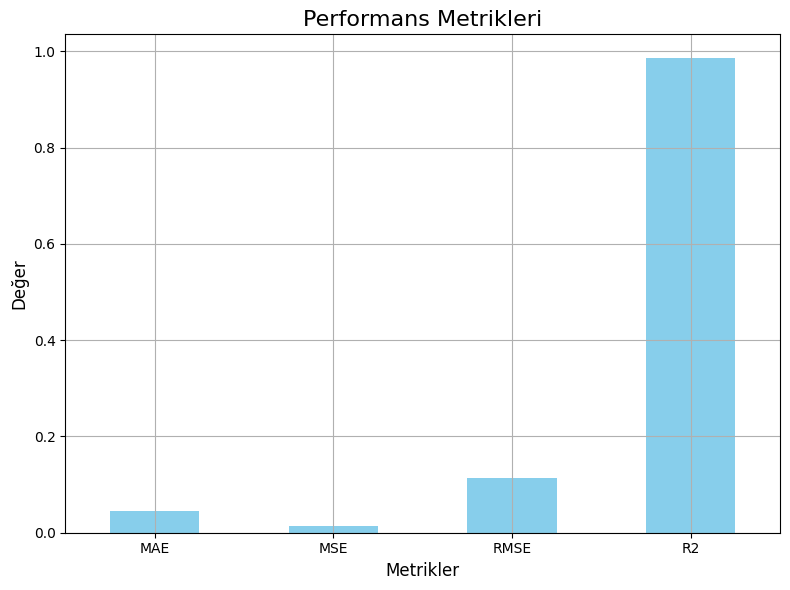

In [242]:
# En iyi modeli ve verisetini bulduk

# Linear Regresyon modeli ile Numerik verileri Ortalama ve Kategorik verileri Mod ile doldurduğumuz veri seti en iyi performansı göstermiş şimdi bu modeli bu verisetini inceleyelim.

# Sonuçları alıyoruz
selected_result = sonuc_df.loc["Linear Regresyon Iterative Mode"]

y_test = selected_result["test"]
y_pred = selected_result["pred"]

# Seçilen modelin metriklerini alıyoruz
selected_metrics = selected_result[["MAE", "MSE", "RMSE", "R2"]]

# Bar grafikle metrikleri görselleştiriyoruz
plt.figure(figsize=(8, 6))
selected_metrics.plot(kind='bar', color='skyblue')

plt.title(f"Performans Metrikleri", fontsize=16)
plt.xlabel("Metrikler", fontsize=12)
plt.ylabel("Değer", fontsize=12)
plt.xticks(rotation=0)
plt.grid(True)
plt.tight_layout()

print(selected_metrics)
# Grafiği ekrana bastırıyoruz
plt.show()

**MAE:** Modelin tahmin hatalarının ortalama büyüklüğünü verir. Düşük olması tercih edilir. Tahmin değerlerimiz ve gerçek değerler arasında çok bir fark olmadığı gözlenebiliyor.

**MSE:** Hataların karesinin ortalamasıdır ve büyük hatalara daha fazla ceza verir. Düşük olması tercih edilir. Bu metrikte ise çok düşük bir değere sahibiz yani kritik hatalardan uzak bir modelimiz var.

**RMSE:** MSE'nin kareköküdür ve birim olarak daha anlamlıdır. Düşük olması tercih edilir.

**R2:** Modelin veriye ne kadar uyduğunu gösterir. 1'e yakın olması tercih edilir.

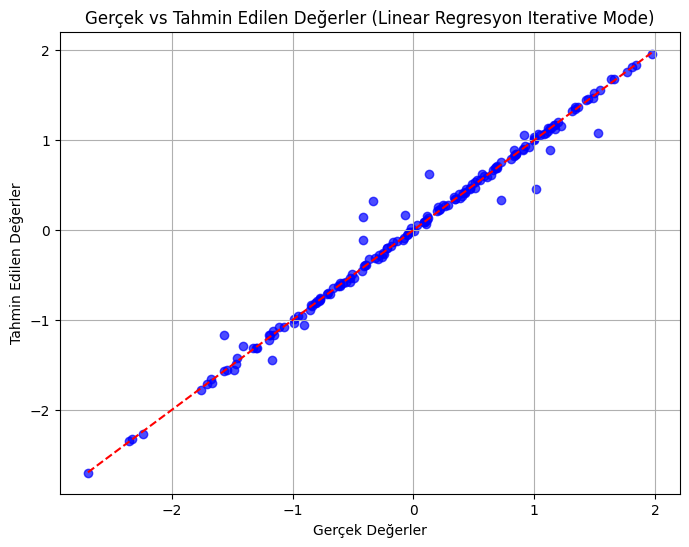

In [238]:
# Gerçek ve Tahmin Edilen Değerlerin Dağılım Grafiği
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title(f"Gerçek vs Tahmin Edilen Değerler ({best_model_name})")
plt.xlabel("Gerçek Değerler")
plt.ylabel("Tahmin Edilen Değerler")
plt.grid(True)

plt.show()

Scatter plot grafiğimizi incelediğimizde uç değerlere sahip olmayan ve gerçek değerele oldukça yakın sonuçlarımızı görebiliriz.

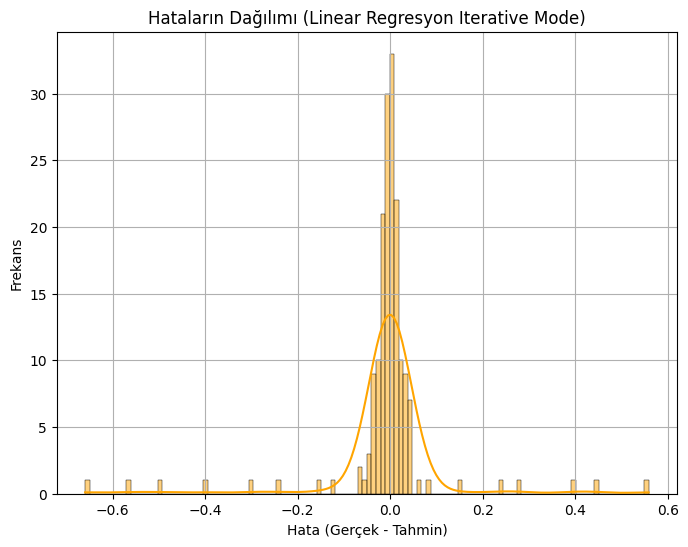

In [239]:
# Hataların Dağılımı (Gerçek - Tahmin)
errors = y_test - y_pred
plt.figure(figsize=(8, 6))
sns.histplot(errors, kde=True, color='orange')
plt.title(f"Hataların Dağılımı ({best_model_name})")
plt.xlabel("Hata (Gerçek - Tahmin)")
plt.ylabel("Frekans")
plt.grid(True)
plt.show()

Hata Dağılımı grafiğimize baktığımızda tahminlerimiz gerçek değere yakın bir şekilde konumlanmıştır. Uç değerlerde hata oranı oldukça azdır.  